<a href="https://colab.research.google.com/github/misaelLS21/Bayesian_proyect/blob/main/Proyecto_Bayesiana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Proyecto Final Estadistica Bayesiana 2021-1
## Integrantes: 

*   Becerra Burguete José de Jesús
*   Flores Reyes Luis Daniel
*   Hernández Alfato Iván
*   López Sánchez Misael
*   Maqueda Hinojosa Marco Antonio

# Motivación y antecedentes

La Ciudad de México, año con año sufre de constantes delitos, en este proyecto buscamos utilizar técnicas y métodos bayesianos para poder evaluar el nivel de violencia en la cápital del país. Para esto trabajamos con las carpetas de investigación emitidas por la Fiscalia General de Justicia (PGJ) en el 2020.  

## Sobre la descarga de los datos.

Los datos con los que estamos trabajando son públicos y fueron extraídos del *Portal de datos abiertos de la Ciudad de México* al cual se puede acceder desde el siguiente link: [PGJ 2020](https://datos.cdmx.gob.mx/dataset/carpetas-de-investigacion-pgj-cdmx) , el cual  contiene información de las carpetas de investigación abiertas por diferentes tipos de delito en la Ciudad de México.

Para fines de este proyecto y debido a la enorme dimensión de los datos, solo trabajaremos con la información disponible de 2020 que contiene registro de hasta 156,726 carpetas de investigación que se han abierto en el periodo Enero-Octubre de ese año.

# Instalación de algunas bibliotecas

In [ ]:
!pip install pymc3>=3.8 # Necesaria para trabajar con modelos bayesianos
!pip install geopandas # Necesaria para poder trabajar con cordenadas geográficas en pandas
#!pip install arviz # Biblioteca necesaria para la conección de los datos con 

     |████████████████████████████████| 972kB 5.3MB/s 
     |████████████████████████████████| 6.5MB 13.0MB/s 
     |████████████████████████████████| 14.8MB 194kB/s 


In [ ]:
#actualización necesaria para poder realizarlos gráficos con pymc3
!pip install pymc3[plots] -q 

     |████████████████████████████████| 1.6MB 4.3MB/s 
     |████████████████████████████████| 737kB 19.3MB/s 
     |████████████████████████████████| 4.7MB 30.8MB/s 
     |████████████████████████████████| 327kB 27.3MB/s 


## Carga de los datos desde Github

En Github es donde tenemos almacenados principamente los datos que utilizamos en este proyecto por lo que con los siguientes dos comandos procedemos a traer esa información: 

- **carpetas_pgj_2020.zip**: Contiene la información de la muestra de datos descargados desde el portal de datos abiertos de la Ciudad de México donde tomamos sólo la muestra de los delitos ocurridos de Enero a Octubre de 2020 en la Ciudad de Mééxico.

- **alcaldias.zip**: Contiene los datos en formato geo-jeson para poder trabajar con los mapas de la biblioteca *folium* y, así, poder identificar puntualmente donde se estan cometiendo los delitos en la ciudad.

In [ ]:
# Leemos el conjunto de datos desde Pandas con la liga WEB
!wget -O carpetas_pgj_2020.zip https://github.com/misaelLS21/Bayesian_proyect/blob/main/carpetas_pgj_2020.zip?raw=true
!unzip carpetas_pgj_2020.zip

--2021-01-29 19:12:03--  https://github.com/misaelLS21/Bayesian_proyect/blob/main/carpetas_pgj_2020.zip?raw=true
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/misaelLS21/Bayesian_proyect/raw/main/carpetas_pgj_2020.zip [following]
--2021-01-29 19:12:03--  https://github.com/misaelLS21/Bayesian_proyect/raw/main/carpetas_pgj_2020.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/carpetas_pgj_2020.zip [following]
--2021-01-29 19:12:04--  https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/carpetas_pgj_2020.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.1

In [ ]:
# Leemos la carpeta con datos geograficos para usarlos con folium
!wget -O alcaldias.zip https://github.com/misaelLS21/Bayesian_proyect/blob/main/alcaldias.zip?raw=true
!unzip alcaldias.zip

--2021-01-29 19:12:05--  https://github.com/misaelLS21/Bayesian_proyect/blob/main/alcaldias.zip?raw=true
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/misaelLS21/Bayesian_proyect/raw/main/alcaldias.zip [following]
--2021-01-29 19:12:05--  https://github.com/misaelLS21/Bayesian_proyect/raw/main/alcaldias.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/alcaldias.zip [following]
--2021-01-29 19:12:05--  https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/alcaldias.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request

In [ ]:
!wget -O complements.zip https://github.com/misaelLS21/Bayesian_proyect/blob/main/complements.zip?raw=true
!unzip complements.zip

--2021-01-29 19:12:06--  https://github.com/misaelLS21/Bayesian_proyect/blob/main/complements.zip?raw=true
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/misaelLS21/Bayesian_proyect/raw/main/complements.zip [following]
--2021-01-29 19:12:06--  https://github.com/misaelLS21/Bayesian_proyect/raw/main/complements.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/complements.zip [following]
--2021-01-29 19:12:06--  https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/complements.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HT

# Carga de los datos en Colab.
Importamos los datos desde **GitHub** a Colab y e revisan las dimensiones de la información que tenemos antes de empezar a trabajar en el analísis exploratorio y la implementación de los algoritmos bayesianos.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pymc3 as pm
import geopandas as gpd
import folium as folium
import datetime as dt
import warnings
import arviz
import scipy.stats as stats
import theano.tensor as tt # Nueba biblioteca importante para esta seccioón

from matplotlib import gridspec

warnings.filterwarnings("ignore", category=FutureWarning)
plt.style.use('seaborn-white')
color = '#87ceeb'
palette = 'muted'
sns.set_palette(palette); sns.set_color_codes(palette)
np.set_printoptions(precision=2)
pd.set_option('display.precision', 2)

%matplotlib inline


La visualización de las tablas de los datos completos puede también consultarse directamente del portal de datos abiertos en el siguiente [link](https://datos.cdmx.gob.mx/explore/embed/dataset/carpetas-de-investigacion-pgj-de-la-ciudad-de-mexico/table/?disjunctive.ao_hechos&disjunctive.delito)




In [ ]:
data_pgj = pd.read_csv('carpetas_pgj_2020.csv')
data_pgj.head() # Leemos la informacióón de las carpetas de investigacióón del a pgj del 2020

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,calle_hechos2,longitud,latitud,geopoint
0,2020,Marzo,2020-03-12 12:40:00,DISCRIMINACION,DELITO DE BAJO IMPACTO,FISCALÍA PARA LA INVESTIGACIÓN DE LOS DELITOS ...,B,UI-3CD,ALVARO OBREGON,OLIVAR DE LOS PADRES,2020,Marzo,2020-03-13 20:07:47,CALZADA DESIERTO DE LOS LEONES,NaN,-99.21,19.35,"19.3451295474,-99.2089101854"
1,2020,Marzo,2020-03-13 14:30:00,AMENAZAS,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MIGUE...,MH-4,UI-3SD,MIGUEL HIDALGO,TORRE BLANCA,2020,Marzo,2020-03-13 20:11:08,LAGO NICARAGUA,NaN,-99.20,19.46,"19.4581485998,-99.196374"
2,2020,Marzo,2020-03-13 19:45:00,ROBO A NEGOCIO SIN VIOLENCIA,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-1,UI-3CD,COYOACAN,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO,2020,Marzo,2020-03-13 20:15:16,CIRCUITO MARIO DE LA CUEVA,NaN,-99.18,19.32,"19.320996583,-99.1761783015"
3,2020,Marzo,2020-03-13 16:45:00,ENCUBRIMIENTO,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN ESTRATÉGICA DEL DELI...,ORIENTEII,UI-3CD,IZTAPALAPA,EL SANTUARIO,2020,Marzo,2020-03-13 20:15:37,EEJE 8 SUR (CALZ. ERMITA IZTAPALAPA),1a. CDA. SAN JUAN,-99.10,19.36,"19.3556579019,-99.096069253"
4,2020,Marzo,2020-03-13 05:45:00,ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA,ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIO...,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN IZTAP...,IZP-2,UI-2SD,IZTAPALAPA,SAN JUAN JOYA,2020,Marzo,2020-03-13 20:25:03,FELIPE OBREGON,CASI ESQUINA CON CANAL DE GARAY,-99.07,19.34,"19.3361261221,-99.0656272944"


# Análisis explotatorio y descriptivo de la información.

Realizamos exploración y muestreo de los datos para poder observar si hay correlaciones, distribuciones o algo que nos pueda ayudar a comprender de mejor manera cómo es que se esta distribuyendo la información y los datos.

In [ ]:
# Dimension de los datos
data_pgj.shape # Tenemos 156,726 datos distribuidos en 18 columnas

(156726, 18)

In [ ]:
data_pgj.info() # Observamos el tipo de datos con los que contamos por el momento.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156726 entries, 0 to 156725
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ao_hechos             156726 non-null  int64  
 1   mes_hechos            156726 non-null  object 
 2   fecha_hechos          156726 non-null  object 
 3   delito                156726 non-null  object 
 4   categoria_delito      156726 non-null  object 
 5   fiscalia              156726 non-null  object 
 6   agencia               156726 non-null  object 
 7   unidad_investigacion  156725 non-null  object 
 8   alcaldia_hechos       156713 non-null  object 
 9   colonia_hechos        150179 non-null  object 
 10  ao_inicio             156726 non-null  int64  
 11  mes_inicio            156726 non-null  object 
 12  fecha_inicio          156726 non-null  object 
 13  calle_hechos          156453 non-null  object 
 14  calle_hechos2         59635 non-null   object 
 15  

In [ ]:
data_pgj.dtypes # Y el tipo de datos que tenemos, despues vamos a tener que transformar algunos

ao_hechos                 int64
mes_hechos               object
fecha_hechos             object
delito                   object
categoria_delito         object
fiscalia                 object
agencia                  object
unidad_investigacion     object
alcaldia_hechos          object
colonia_hechos           object
ao_inicio                 int64
mes_inicio               object
fecha_inicio             object
calle_hechos             object
calle_hechos2            object
longitud                float64
latitud                 float64
geopoint                 object
dtype: object

Realizamos un poco de pre-procesamiento de los datos para después proceder a realizar las consultas sobre la información, los cambios que realizamos son los siguiente: 

- Cambio del campo fecha_hechos separándolo en fecha y en hora de los hechos; pues deseamos conocer el día y fecha exacta donde ocurrieron los hechos. 



In [ ]:
# Separamos la informacióón de 'fecha_hechos' en dos columnas nuevas
data_pgj[['fecha_h', 'hora_h']] = data_pgj.fecha_hechos.str.split(expand=True)
data_pgj.head()

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,calle_hechos2,longitud,latitud,geopoint,fecha_h,hora_h
0,2020,Marzo,2020-03-12 12:40:00,DISCRIMINACION,DELITO DE BAJO IMPACTO,FISCALÍA PARA LA INVESTIGACIÓN DE LOS DELITOS ...,B,UI-3CD,ALVARO OBREGON,OLIVAR DE LOS PADRES,2020,Marzo,2020-03-13 20:07:47,CALZADA DESIERTO DE LOS LEONES,NaN,-99.21,19.35,"19.3451295474,-99.2089101854",2020-03-12,12:40:00
1,2020,Marzo,2020-03-13 14:30:00,AMENAZAS,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MIGUE...,MH-4,UI-3SD,MIGUEL HIDALGO,TORRE BLANCA,2020,Marzo,2020-03-13 20:11:08,LAGO NICARAGUA,NaN,-99.20,19.46,"19.4581485998,-99.196374",2020-03-13,14:30:00
2,2020,Marzo,2020-03-13 19:45:00,ROBO A NEGOCIO SIN VIOLENCIA,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-1,UI-3CD,COYOACAN,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO,2020,Marzo,2020-03-13 20:15:16,CIRCUITO MARIO DE LA CUEVA,NaN,-99.18,19.32,"19.320996583,-99.1761783015",2020-03-13,19:45:00
3,2020,Marzo,2020-03-13 16:45:00,ENCUBRIMIENTO,DELITO DE BAJO IMPACTO,FISCALÍA DE INVESTIGACIÓN ESTRATÉGICA DEL DELI...,ORIENTEII,UI-3CD,IZTAPALAPA,EL SANTUARIO,2020,Marzo,2020-03-13 20:15:37,EEJE 8 SUR (CALZ. ERMITA IZTAPALAPA),1a. CDA. SAN JUAN,-99.10,19.36,"19.3556579019,-99.096069253",2020-03-13,16:45:00
4,2020,Marzo,2020-03-13 05:45:00,ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA,ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIO...,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN IZTAP...,IZP-2,UI-2SD,IZTAPALAPA,SAN JUAN JOYA,2020,Marzo,2020-03-13 20:25:03,FELIPE OBREGON,CASI ESQUINA CON CANAL DE GARAY,-99.07,19.34,"19.3361261221,-99.0656272944",2020-03-13,05:45:00


Procedemos a hacer un análisis descriptivo de nuestra información, mostrando las gráficas de ocurrencia delictiva en la CDMX de los meses mencionados (Enero - Octubre) del 2020.

Text(0.5, 1.0, 'Cantidad de delitos por mes en la CDMX')

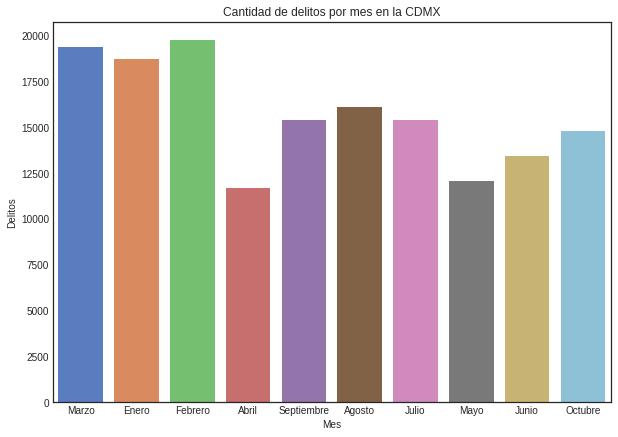

In [ ]:
# Calculamos la frecuencia de delitos por mes (¿Qué mes del año fue el más delictivo?)
plt.figure(figsize=(10,7))
sns.countplot("mes_hechos", data=data_pgj)
plt.xticks(rotation=0)
plt.ylabel('Delitos')
plt.xlabel('Mes')
plt.title("Cantidad de delitos por mes en la CDMX")


Text(0.5, 1.0, 'Cantidad de delitos por categoría en la CDMX')

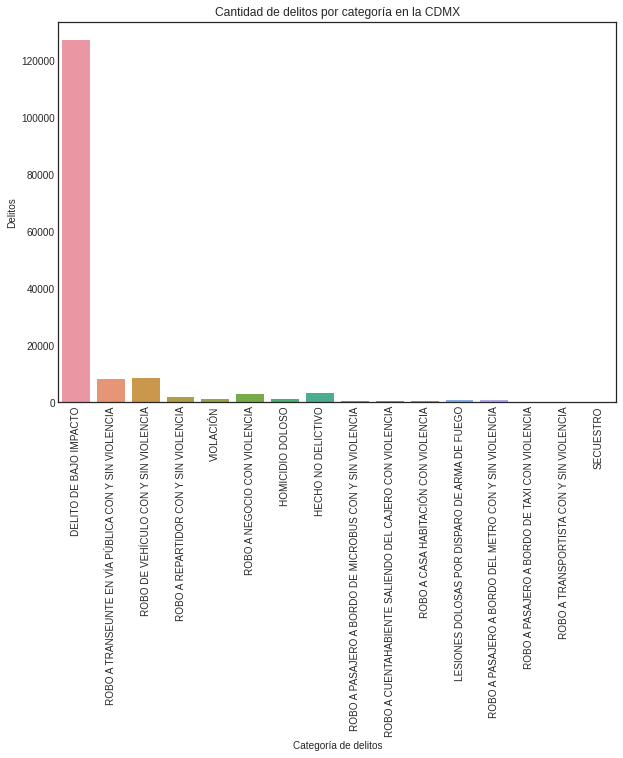

In [ ]:

# Observamos el comportamiento de las categorías de delito
plt.figure(figsize=(10,7))
sns.countplot("categoria_delito", data = data_pgj)
plt.xticks(rotation = 90)
plt.ylabel("Delitos")
plt.xlabel("Categoría de delitos")
plt.title("Cantidad de delitos por categoría en la CDMX")

Como podemos observar predominan los delitos de bajo impacto en la CDMX, ahora nos acercaremos más a esta categoría de delito para identificar qué delitos en específico son los más concurrentes. 
Los 10 delitos de bajo impacto más reportados son los siguientes:
- Violencia familiar
- Amenazas
- Fraude 
- Robo de Objetos
- Robo de accesorios de auto
- Robo a negocios sin violencia
- Robo a negocio sin violencia por farderos (En tiendas de autoservicio)
- Robo de objetos del interior de un vehículo
- Narcomenudeo posesión simple 
- Robo a casa habitación sin violencia


Text(0.5, 1.0, 'Delitos de bajo impacto frecuentes')

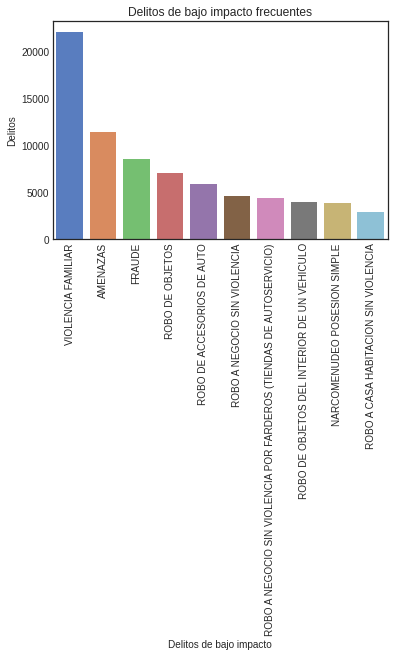

In [ ]:
#¿Cuáles delitos de bajo impacto suceden más?

data_pgj["delito"][data_pgj["categoria_delito"]== "DELITO DE BAJO IMPACTO"].head()
sns.countplot(data_pgj["delito"][data_pgj["categoria_delito"]== "DELITO DE BAJO IMPACTO"], order=pd.value_counts(data_pgj["delito"][data_pgj["categoria_delito"]== "DELITO DE BAJO IMPACTO"]).iloc[:10].index)
plt.xticks(rotation = 90)
plt.ylabel("Delitos")
plt.xlabel("Delitos de bajo impacto")
plt.title("Delitos de bajo impacto frecuentes")



# Serie de Tiempo de los crimenes en la CDMX en 2020.

Realizamos una pequeña representación en forma de serie de tiempo de los crimenes ocurridos por día en la CDMX, donde buscamos medir el impacto de la pandemía de `Sars-Cov2` en los delitos de la Ciudad de México.

- Hay que hacer una investigacióón de los hechos relevantes de detenciones en la CDMX, El atentado contra `Garcia Harfuch` por ejemplo
- Ver si la pandemia ha sido un componente que hizo explotar el crimen de marzo en adelante. 


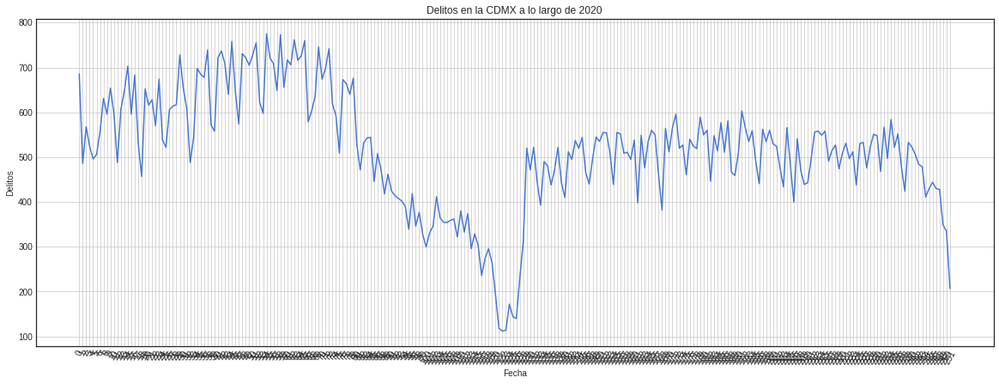

In [ ]:
# Hacemos un conteo de la cateroríía de delito por día y filtramos aquellos díías donde han habido máás de 100 delitos por día
delitos_diarios = pd.pivot_table(data=data_pgj, index='fecha_h', columns=['ao_hechos'], values='mes_hechos', aggfunc='count')
delitos_diarios = delitos_diarios[delitos_diarios[2020] >= 100] # filtramos las columans donde haya maśś de 100 delitos por díía
delitos_diarios = delitos_diarios.reset_index() # Quitamos los indices porue son molestos
plt.figure(figsize=(20,7))
ax1 = sns.lineplot(data=delitos_diarios, x='fecha_h', y = delitos_diarios[2020] )
plt.grid()
plt.title("Delitos en la CDMX a lo largo de 2020")
plt.ylabel('Delitos')
plt.xlabel('Fecha')
ax1.set_xticklabels(ax1.get_xticks(), rotation= 60)
plt.show()



Observación: De la gráfica anterior podemos observar que el efecto del `Sars-Cov2` tuvo un fuerte impacto en el crimen de la Ciudad de México, pues antes del inicio de la pandemia se puede observar una cantidad periódica de delitos, pero una vez iniciando las restricciones para contener el virus en la Ciudad y evitar su propagación, el número de delitos en la ciudad se desplomó.

In [ ]:
# Estos fueron los 10 días con más crimenes en la CDMX.
# La mayioria corresponde a un periodo antes de la pandemíía
delitos_diarios.sort_values(2020, ascending=False).head(10) # Corresponde al periodo pre-covid

ao_hechos,fecha_h,2020
54,2020-02-24,775
58,2020-02-28,773
62,2020-03-03,762
65,2020-03-06,760
44,2020-02-14,758
51,2020-02-21,755
69,2020-03-10,746
72,2020-03-13,742
37,2020-02-07,739
41,2020-02-11,737


# Inferencias Gaussianas con PyMC3

Se realizan algunas inferencias gaussianas sobre la distribución de los delitos en la Ciudad de México, para esto se utiliza la biblioteca `Pymc3` que nos permite realizar analísis Bayesiano con Python.

Hacemos inferencias Gaussianas sobre la distribución de los delitos diarios en 2020 asumiendo que los datos tienen una distribución gaussiana y como no conocemos la media ni la desviación estandar entonces debemos de elegir distribuciones apriori no informativas para tratar de aproximar por médio de un modelo bayesiano el verdadero valor de este. 

Para esto un modelo razonable podria ser: 

$$ \mu \sim Uniform(l,h)$$
$$ \sigma \sim HalfNormal(\sigma_h)$$
$$ y \sim Normal(\mu, \sigma)$$

Así $\mu$ viene de una distribución uniforme ente $l$ y $h$ que son desconocidos y elegiremos como parámetros iniciales no informativos, y $\sigma$ de una distribución normal truncada. El diagrama de distribución del algoritmo queda como: 


![](https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/picture_1.png)



y la implementación de nuestro modelo es el siguiente: 

515.5793650793651
130.46086521243765


Text(0.5, 1.0, 'Acumulación de delitos diarios en la CDMX')

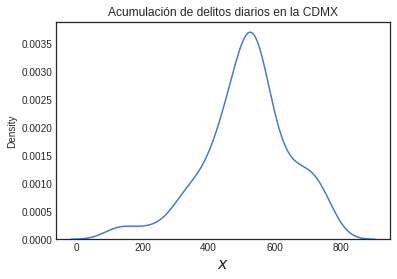

In [ ]:
# Obtenemos los datos de los delitos diarios en la CDMX
del_d = list(delitos_diarios[2020])

# Queremos saber los delitos promedio así que eliminamos outlier usando regla del cuantil
#3quant = np.percentile(del_d, [25, 75]) # cuantiles al 0.25 y 0.75
#iqr = quant[1] - quant[0] # Nos quedamos con loos datos que se encuentren en
#upper_b = quant[1] + iqr * 1.5
#lower_b = quant[0] - iqr * 1.5
#clean_data = del_d[(del_d > lower_b) & (del_d < upper_b)]

# imprimimos la distribucióón de los delitos
# Calculamos la media de los delitos
print(np.mean(del_d)) 
# Asíí como la desviación estandar de estos
print(np.std(del_d))
# Imprimimos la gráfica acumulada de los delitos ocurridos
sns.kdeplot(del_d)
plt.xlabel('$x$', fontsize=16)
plt.title("Acumulación de delitos diarios en la CDMX")

Implementamos un primer modelo llamado `model_g` en el cual calcularemos todos los posibles casos en los cuales escenarios de delitos diarios que pueden ocurrir en la ciudad.

In [ ]:

with pm.Model() as model_g:
    # Establecemos una apriori para el modelo gaussiano
    # A priori no informativa, pues la estimamos pero no conocemos tasa o información previa
    # Así que ponemos el valor min y max de los valores observados
    mu = pm.Uniform('mu', lower=min(del_d), upper=max(del_d)) 
    sigma = pm.HalfNormal('sigma', sd=130)
    # Funcion de verosimilitud
    y = pm.Normal('y', mu=mu, sd=sigma, observed=del_d)
    # Implementamos el algoritmo iterando 1100
    trace_g = pm.sample(1100)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, mu]
100%|██████████| 1600/1600 [00:01<00:00, 1474.97it/s]


Tomamos los valores de la cadena a partir de las 500 iteraciones, con esto eliminando los primeros valores de calentamiento estocástico y quedándonos con los valores más confiables.

In [ ]:
chain_g = trace_g[500:]
#pm.plot_trace(chain_g)

Imprimimos todos los posibles valores que se obtuvieron de la posterí al implementar el algoritmo bayesiano gaussiano. 

#### ¿Cómo interpretar el modelo?
Este primer modelo muestra todos los posibles valores que se calcularon para delitos diarios dentro de la Ciudad de México, observemos que calculamos 1600 predicciones para los delitos diarios, esto para poder obtener una distribución más confiable de los sucesos que en realidad ocurrieron en la CDMX, pues no todos los delitos que suceden en la ciudad son registrados, pues para esto necesita hacerse una denuncia para iniciar una carpeta de investigación.

Al realizar la predicción posteriori por un método bayesiano obtenemos así una aproximación más confiable de la verdadera distribución de los delitos en la ciudad.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: sample_ppc() is deprecated.  Please use sample_posterior_predictive()
  
100%|██████████| 100/100 [00:01<00:00, 89.55it/s]


Text(0.5, 0, '$x$')

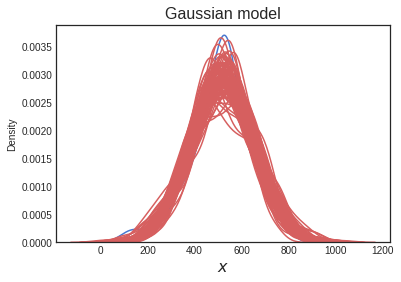

In [ ]:
# Obtenemos los valores de la cadena y los guardamos como vectores de logitudes predecidas
y_pred = pm.sample_ppc(chain_g, 100, model_g, size=len(del_d))
# Imprimimos los valores originales de los datos observados
sns.kdeplot(del_d, color='b')
# Imprimimos todos los valores calculados de las posteriores analizados del método gausiano
for i in y_pred['y']:
    sns.kdeplot(i[0], color='r', alpha=0.05)
plt.title('Gaussian model', fontsize=16)
plt.xlabel('$x$', fontsize=16)


Calculamos ahora la media y la varianza de los delitos en la CDMX después de haber interpretado el modelo gaussiano bayesiano.

In [ ]:
# Poner en esta parte el calulo de la media y la desviacióón de y_pred o bien una resumen
#y_pred['y'].mean()
print("Nueva Media: {}".format(y_pred['y'].mean()))
print("Nueva desviación: {}".format(np.std(y_pred['y'])))

Nueva Media: 517.0403086494746
Nueva desviación: 131.27023391931957


# Analisis de serie de tiempo de los delitos en la CDMX por hora.

De manera análoga al modelo con los delitos por día, realizamos un analisis de los delitos por hora realizados en la Ciudad de México para poder observar aquellos intervalos de tiempo con más incidencia delictiva, obteniendo como resultado la siguiente gráfica:



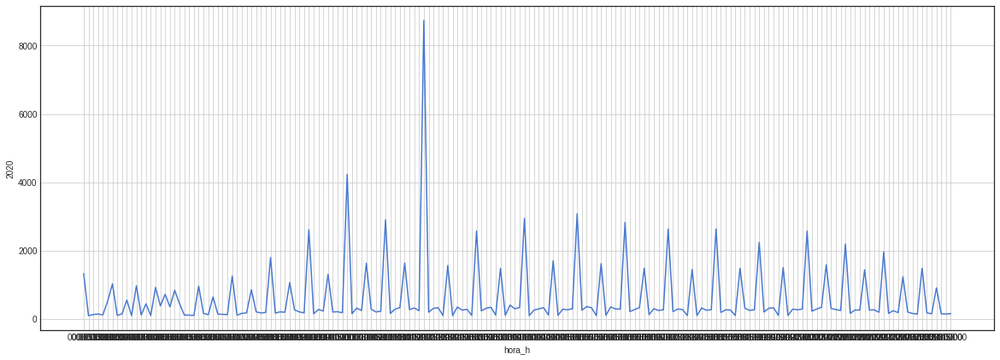

In [ ]:
# Creamos una serie de tiempo pero ahora por horas, para ver las horas más conflictivas con mayor número de delitos cometidos.
delitos_horas = pd.pivot_table(data=data_pgj, index='hora_h', columns=['ao_hechos'], values='mes_hechos', aggfunc='count')
delitos_horas = delitos_horas.reset_index()
# Nos interesarán solo aquellos registros donde se cometieron más de 100 delitos por día
delitos_horas = delitos_horas[delitos_horas[2020] >= 100] 
# Imprimimos la gráfica de delitos por hora.
plt.figure(figsize=(20,7))
ax2 = sns.lineplot(data=delitos_horas, x='hora_h', y = delitos_horas[2020] )
plt.grid()
plt.show()


**Ya** observamos que los delitos parecen tener una periodicidad más o menos homogénea, pero existe un punto que llama nuestra atención por su particulariad en los delitos que se disparan a más de $8000$ en una simple hora en el transcurso del día.

Observamos del siguiete dataframe cuáles son las horas donde ocurren más delitos en la ciudad y contrario a lo que se esperaba (que los delitos se acumularan en la tarde-noche) la mayoría de los delitos se acumulan de hecho en la mañana y en el medio día, posiblemente tratándose de delitos de bajo impacto, que como ya se comentaba, conforman una gran porción de los sucesos delictivos.

In [ ]:
# ordencon respecto a las horas máás probables que te asalten.
delitos_horas.sort_values(2020, ascending=False).head(10) # El medio día tiene más sucesos

ao_hechos,hora_h,2020
720,12:00:00,8733
600,10:00:00,4233
900,15:00:00,3080
840,14:00:00,2946
660,11:00:00,2904
960,16:00:00,2829
1080,18:00:00,2638
1020,17:00:00,2633
540,09:00:00,2616
1200,20:00:00,2578


# Comparación de grupos por alcaldías de la Ciudad de México.

El problema al que nos enfrentamos ahora es el de observar las diferencias entre distintos tipos de grupos, especificamente por alcaldías, pues queremos hacer inferencias sobre estos parámetros para poder observar si es que hay alguna diferencía entre los niveles de crimen entre las delegaciones **ALVARO OBREGON** y **GUSTAVO A MADERO** por citar un ejemplo.

Para esto de igual forma nos apoyaremos de un modelo bayesiano gaussiano, pero ahora contrastaremos al mismo tiempo 4 diferentes tipos de muestras (que corrsponden a las delegaciones con mayores incidencia criminal), pero antes de pasar a esto le daremos un pequeño vistazo al análisis exploratorio de las alcaldías.

¿Qué alcaldías y que colonias presentan mayor cantidad de delitos?


In [ ]:
delitos_alcaldias = pd.pivot_table(data=data_pgj, index=['alcaldia_hechos','colonia_hechos'], columns='ao_hechos', values='ao_inicio', aggfunc='count')
delitos_alcaldias = delitos_alcaldias.reset_index()
# Ordenadas las colonias y alcaldíías con más delitos en la CDMX
# Ahí esta mi San Tocho :'v
delitos_alcaldias.sort_values(2020, ascending=False).head(10) 

ao_hechos,alcaldia_hechos,colonia_hechos,2020
569,CUAUHTEMOC,CENTRO,3932
573,CUAUHTEMOC,DOCTORES,2071
353,BENITO JUAREZ,DEL VALLE CENTRO,1824
587,CUAUHTEMOC,ROMA NORTE,1452
369,BENITO JUAREZ,NARVARTE,1376
567,CUAUHTEMOC,BUENAVISTA,1253
788,IZTACALCO,AGRÍCOLA ORIENTAL,1226
869,IZTAPALAPA,CENTRAL DE ABASTO,1127
577,CUAUHTEMOC,GUERRERO,1123
479,COYOACAN,PEDREGAL DE SANTO DOMINGO,1080


Cantidad de delitos efectuados por las diferentes alcaldías en la Ciudad de México

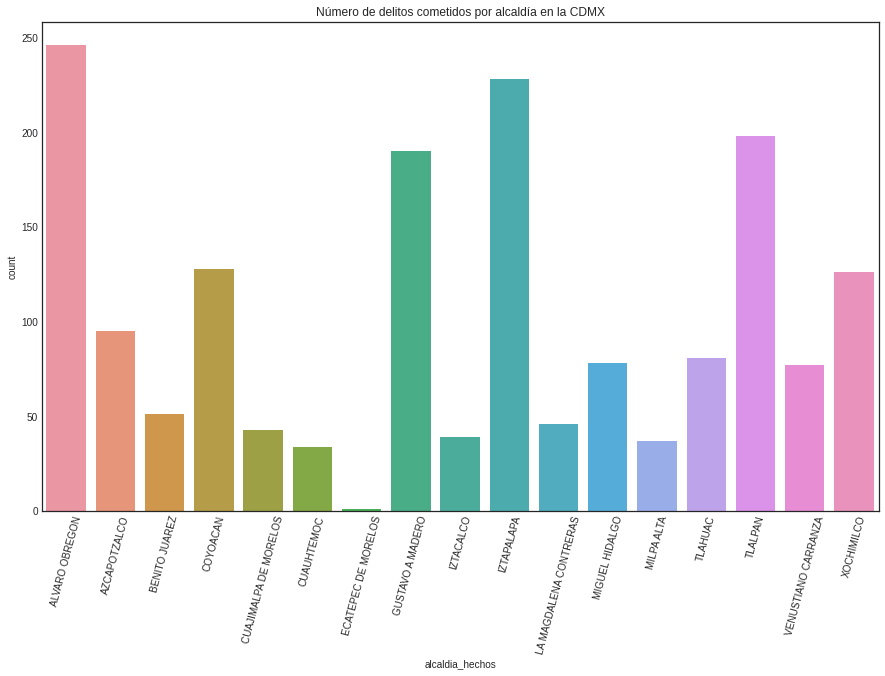

In [ ]:
# Creamos un mapa de calor para ver el grado de correlacion
plt.figure(figsize=(15,9))
sns.countplot(x='alcaldia_hechos', data= delitos_alcaldias)
plt.title("Número de delitos cometidos por alcaldía en la CDMX")
plt.xticks(rotation=75)
plt.show()

Creamos una tabla para medir los delitos por día que ha habido en las 4 alcaldías con más incidencia delictiva para poder comprobar sus distribuciónes.

In [ ]:
crimes_alcaldy = pd.pivot_table(data=data_pgj, index=['alcaldia_hechos','mes_hechos'],
                                columns=['ao_hechos'], values='ao_inicio',
                                aggfunc='count')

crimes_alcaldy = crimes_alcaldy.reset_index()
crimes_alcaldy = crimes_alcaldy[crimes_alcaldy.alcaldia_hechos.isin(['ALVARO OBREGON','IZTAPALAPA','TLALPAN','GUSTAVO A MADERO'])]
crimes_alcaldy

ao_hechos,alcaldia_hechos,mes_hechos,2020
21,ALVARO OBREGON,Abril,906
22,ALVARO OBREGON,Agosto,1202
23,ALVARO OBREGON,Enero,1324
24,ALVARO OBREGON,Febrero,1371
25,ALVARO OBREGON,Julio,1121
26,ALVARO OBREGON,Junio,1002
27,ALVARO OBREGON,Marzo,1380
28,ALVARO OBREGON,Mayo,871
29,ALVARO OBREGON,Octubre,1097
30,ALVARO OBREGON,Septiembre,1131


Text(0.5, 1.0, 'Violinplot de de delitos por alaldía')

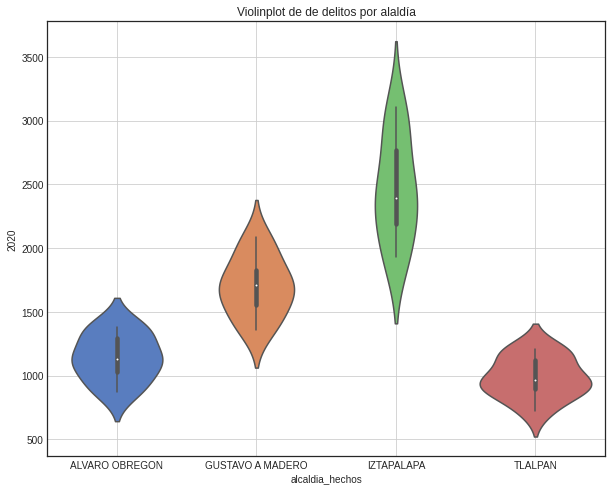

In [ ]:
plt.figure(figsize=(10,8))
sns.violinplot(x='alcaldia_hechos',y=2020,data=crimes_alcaldy).grid()
plt.title("Violinplot de de delitos por alaldía")

## Implementación del modelo `comparing_groups`

Ahora volvemos a implementar un modelo gaussiano para comparar las 4 alcaldías, pero con la diferencia de que en esta ocasión en vez de calcular un sólo valor para $\mu$ y $\sigma$ como en el primer modelo, en esta ocasión tenemos que calcular los mismos valores para 4 grupos con sus respectivas medias y desviaciones; para este tipo de análisis que deseamos realizas, `PyMC3` es muy útil, pues permite la vectorización de un modelo gaussiano simple.

In [ ]:
# Iniciamos los valores y obtenemos los valroes de crimenes por mes
y = crimes_alcaldy[2020].values
# Obtenemos los códigos de las alcaldíías para constrastar en el algoritmo
x = pd.Categorical(crimes_alcaldy['alcaldia_hechos']).codes

# implememtamos el modelo
with pm.Model() as comparing_groups:     
    # Inicializamos la apriori con la media y desviacion conocida de 'y'   
    means = pm.Normal('means', mu=np.mean(y), sd=np.std(y), shape=len(set(x)))
    # Implementamos la desviacióón como una normal truncada
    sds = pm.HalfNormal('sds', sd=np.std(y), shape=len(set(x)))
    # Distribución verosimil a optimizaar
    y = pm.Normal('y', mu=means[x], sd=sds[x], observed=y)
    # Número de iteraciones de la cadena.
    trace_cg = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sds, means]
100%|██████████| 1500/1500 [00:01<00:00, 956.19it/s] 


Primer cadena con la distribución de la media aproximada por la iteración del modelo Gaussiano.

In [ ]:
pm.plot_trace(trace_cg['means'])

In [ ]:
pm.plot_trace(trace_cg['sds'])

Tabla de resumen final de las medias y desviaciones de los 4 diferentes tipos de grupo calculados por medio de un modelo gaussiano vectorizado e iterado; devolvemos para la cadena los valores después de las primeras $100$ iteraciones una vez pasado el periodo de calentamiento.


Nota: por la descomposición de códigos de Python, aparecen con valores numéricos pero recordemos que:

- $\mu_0$: $\mu$(ALVARO OBREGON)
- $\mu_1$: $\mu$(GUSTAVO A MADERO)
- $\mu_2$: $\mu$(IZTAPALAPA)
- $\mu_3$: $\mu$(TLALPAN) 

Una vez que ya conocemos a qué indice corresponde cada alcaldía observemos los valores de las medias obtenidas para cada alcaldía.

In [ ]:
chain_cg = trace_cg[100::]
pm.trace_to_dataframe(chain_cg).mean()

means__0    1142.34
means__1    1696.61
means__2    2403.66
means__3     989.75
sds__0       209.70
sds__1       266.45
sds__2       466.86
sds__3       183.73
dtype: float64

#Coeficiente D de Cohen para medir el tamaño del efecto.

Una forma de calcular la diferencia que existe entre el tamaño de 2 grupos es el coeficiente D de Cohen, o `Cohen's d`:

$$ d = \frac{\mu_1 - \mu_2}{\sqrt{\frac{\sigma_1^2 + \sigma_2^2}{2}}} $$

Este coeficiente mide el efecto del tamaño de la diferencia de las medias con respecto a la desviación estándar de ambos grupos. 

En las gráficas siguientes calculamos precisamente este coeficiente de la media y desviación estimadas, así que podemos calcularlo como una distribución y no sólo un simple valor, pues los valores obtenidos de la vectorización gaussiana nos permite precisamente esto.

A continuación mostarmos la tabla de Interpretación del coeficiente:

|  Rango Valor | Interpretación |
|:------------:|:--------------:|
|  d $\leq$ 0.2  | Pequeño Tamaño |
| 0.2 $\leq$ d $\leq$ 0.5 | Magnitud Media |
| 0.5 $\leq$ d $\leq$ 0.8 |  Alta Magnitud |

Entonces adelantamos los resultados que se obtienen de los grupos según la `Cohen's d`

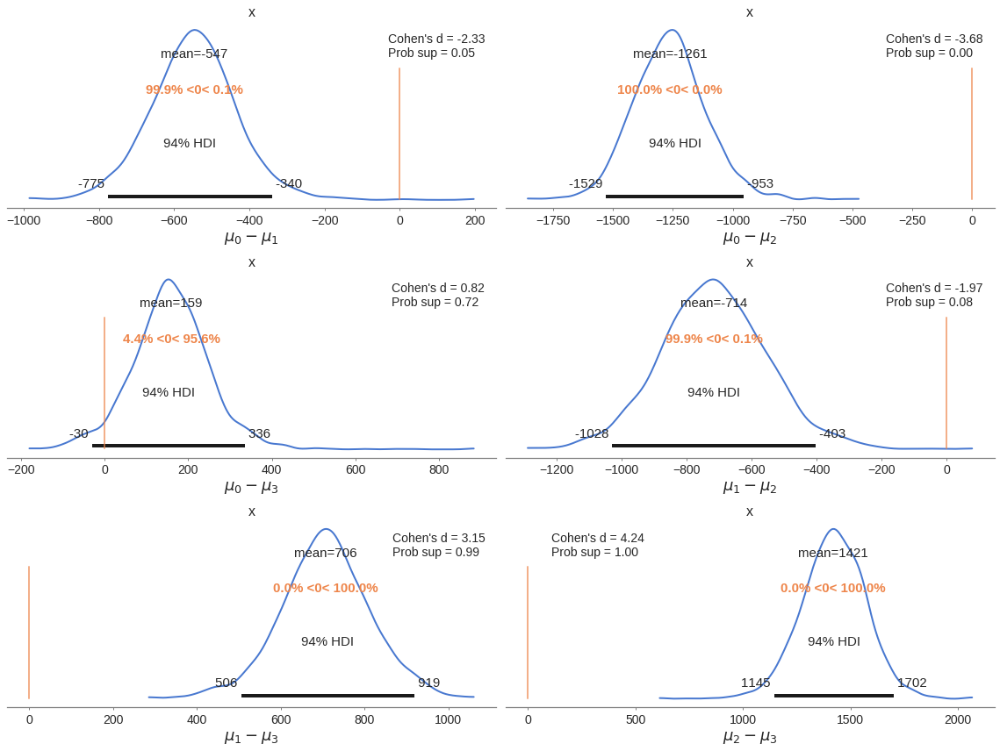

In [ ]:
# Creamos mapas de comparacióón de lo anterior
dist = dist = stats.norm()

_, ax = plt.subplots(3, 2, figsize=(16, 12))

comparisons = [(i,j) for i in range(4) for j in range(i+1, 4)]
pos = [(k,l) for k in range(3) for l in (0, 1)]

for (i, j), (k,l) in zip(comparisons, pos):
    means_diff = chain_cg['means'][:,i]-chain_cg['means'][:,j]
    d_cohen = (means_diff / np.sqrt((chain_cg['sds'][:,i]**2 + chain_cg['sds'][:,j]**2) / 2)).mean()
    ps = dist.cdf(d_cohen/(2**0.5))
        
    pm.plot_posterior(means_diff, ref_val=0, ax=ax[k, l], lw=2)
    ax[k, l].plot(0, label="Cohen's d = {:.2f}\nProb sup = {:.2f}".format(d_cohen, ps) ,alpha=0)
    ax[k, l].set_xlabel('$\mu_{}-\mu_{}$'.format(i, j), fontsize=18)
    ax[k,l ].legend(loc=0, fontsize=14)
plt.tight_layout()

Con lo anterior podemos concluir que existen alcaldías que en sus delitos tiene poca relación de impacto, pues estos no presentan la misma media (es algo que esperabamos pero ahora lo podemos cuantificar) y decir, por ejemplo, que la alcaldía iztapalapa es la más peligrosa por su relación del coeficiente `Cohen's d`

# Modelos de Regresión Logistica para delitos.

TODO LO DE REGRESION LINEAL A PARTIR DE LA PAG 149

Lo que hacemos a continuación es la implementación de 2 modelos de regresión lógistica desde la perspectiva bayesiana.

In [ ]:
data_pgj.categoria_delito.unique()

array(['DELITO DE BAJO IMPACTO',
       'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA',
       'ROBO DE VEHÍCULO CON Y SIN VIOLENCIA',
       'ROBO A REPARTIDOR CON Y SIN VIOLENCIA', 'VIOLACIÓN',
       'ROBO A NEGOCIO CON VIOLENCIA', 'HOMICIDIO DOLOSO',
       'HECHO NO DELICTIVO',
       'ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA',
       'ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA',
       'ROBO A CASA HABITACIÓN CON VIOLENCIA',
       'LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO',
       'ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA',
       'ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA',
       'ROBO A TRANSPORTISTA CON Y SIN VIOLENCIA', 'SECUESTRO'],
      dtype=object)

Creamos una tabla pivote donde lo que nos interesa recuperar son los valores de las categorías de delitos y cuantos delitos es que se han cometido por mes de cada uno de ellos.

In [ ]:
# Creamos pivot table de los delitos por su clasificación
delit_class = pd.pivot_table(data=data_pgj, index=['alcaldia_hechos', 'categoria_delito'],
                             columns= ['mes_hechos'], values='ao_inicio', aggfunc='count' )

delit_class = delit_class.reset_index()
delit_class = delit_class[~delit_class.categoria_delito.isin(['DELITO DE BAJO IMPACTO'])]
# Me interesaron loas siguientes categoríías de delitos.
delit_class = delit_class[delit_class.categoria_delito.isin(['ROBO DE VEHÍCULO CON Y SIN VIOLENCIA', 
                                                             'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA', 
                                                             'ROBO A CASA HABITACIÓN CON VIOLENCIA'])]



#delit_class = delit_class[delit_class.alcaldia_hechos.isin(['ALVARO OBREGON','IZTAPALAPA','TLALPAN','GUSTAVO A MADERO'])]
delit_class = delit_class.fillna(0)

delit_class


mes_hechos,alcaldia_hechos,categoria_delito,Abril,Agosto,Enero,Febrero,Julio,Junio,Marzo,Mayo,Octubre,Septiembre
3,ACAPULCO DE JUAREZ,ROBO A CASA HABITACIÓN CON VIOLENCIA,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,ACAPULCO DE JUAREZ,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
7,ACATLAN,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
19,ALVARO OBREGON,ROBO A CASA HABITACIÓN CON VIOLENCIA,7.0,12.0,3.0,3.0,5.0,6.0,6.0,4.0,4.0,4.0
26,ALVARO OBREGON,ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIO...,55.0,82.0,84.0,87.0,59.0,52.0,84.0,52.0,78.0,74.0
...,...,...,...,...,...,...,...,...,...,...,...,...
554,XOCHIMILCO,ROBO A CASA HABITACIÓN CON VIOLENCIA,1.0,3.0,5.0,3.0,3.0,4.0,6.0,1.0,2.0,3.0
559,XOCHIMILCO,ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIO...,19.0,32.0,27.0,25.0,25.0,27.0,25.0,16.0,19.0,24.0
560,XOCHIMILCO,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,28.0,39.0,70.0,44.0,50.0,41.0,53.0,31.0,51.0,43.0
568,ZAMORA,ROBO DE VEHÍCULO CON Y SIN VIOLENCIA,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


Imprimimos la distribución de estos en un stripplot donde con variables categóricas observamos la cantidad de delitos que se han cometido para cada uno de estos en todo el año.

Realizamos el analísis en el mes de Febrero antes de que inicializaran las cuarentenas por el coronzvisus

(array([0, 1, 2]), <a list of 3 Text major ticklabel objects>)

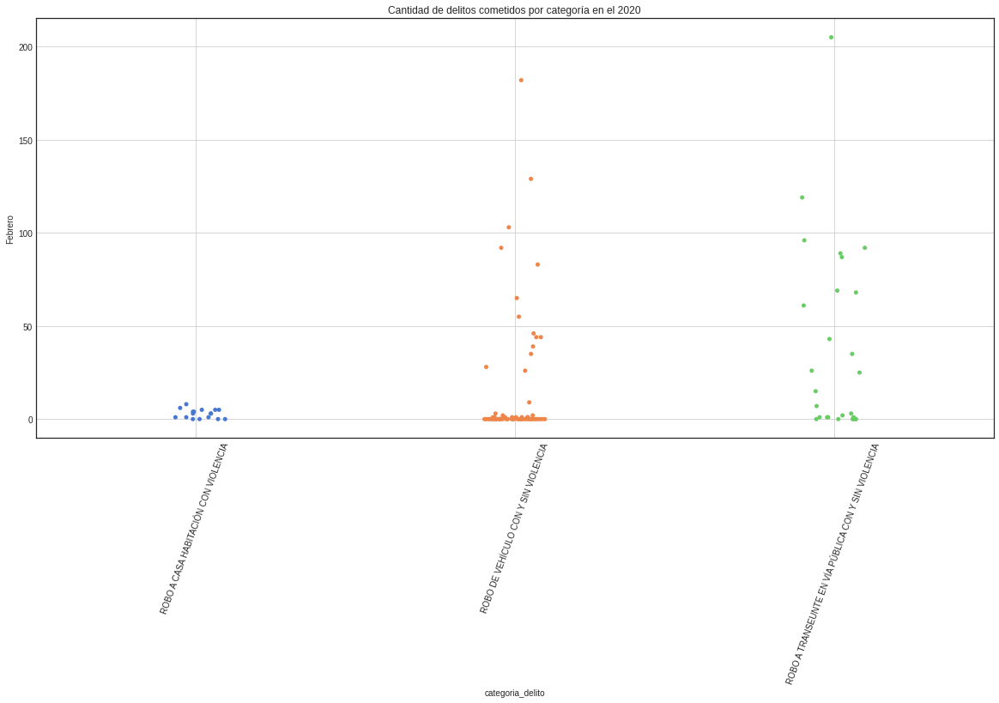

In [ ]:
plt.figure(figsize=(20,9))
sns.stripplot(x="categoria_delito", y="Febrero", data=delit_class, orient="v")
plt.grid()
plt.title("Cantidad de delitos cometidos por categoría en el 2020")
plt.xticks(rotation=70)

A continución lo que realizamos es para el Mes de Marzo que es cuando inicio la cuarentena por el coronavirus en la CDMX

(array([0, 1, 2]), <a list of 3 Text major ticklabel objects>)

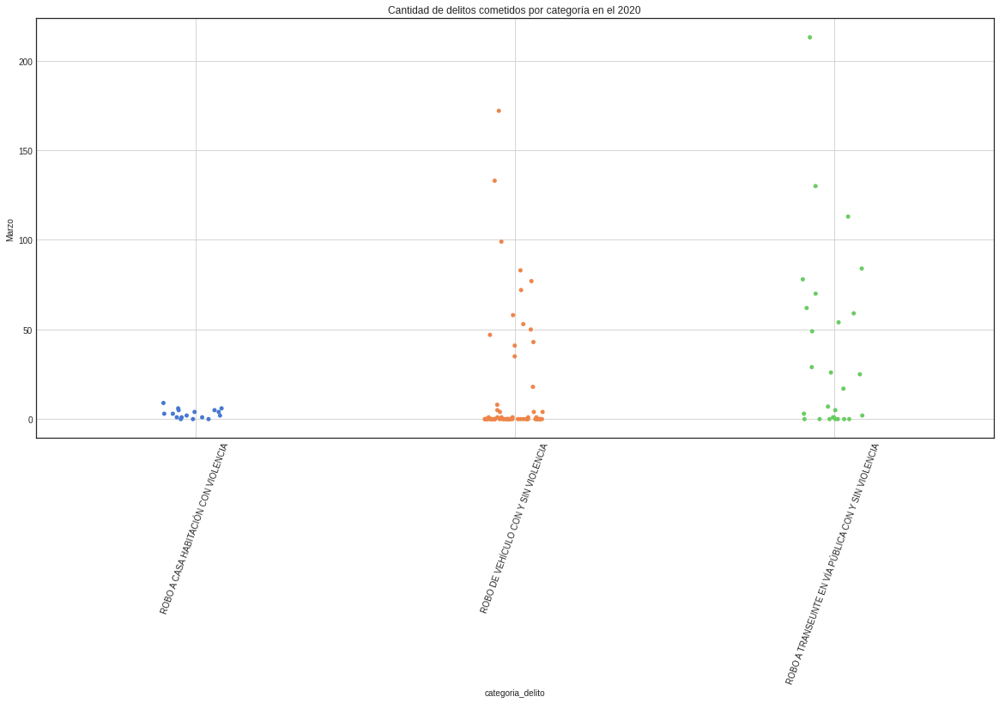

In [ ]:
plt.figure(figsize=(20,9))
sns.stripplot(x="categoria_delito", y="Marzo", data=delit_class, orient="v")
plt.grid()
plt.title("Cantidad de delitos cometidos por categoría en el 2020")
plt.xticks(rotation=70)

Ya pudimos observar como es que se estan distribuyendo los delitos por cada una de las categorías, pero ¿Cómo es que están correlacionados los datos por mes? 

Para esto nos apoyamos de un `pairplot` para poder observar la correlación de los delitos por cada uno de los meses.

<Figure size 1800x576 with 0 Axes>

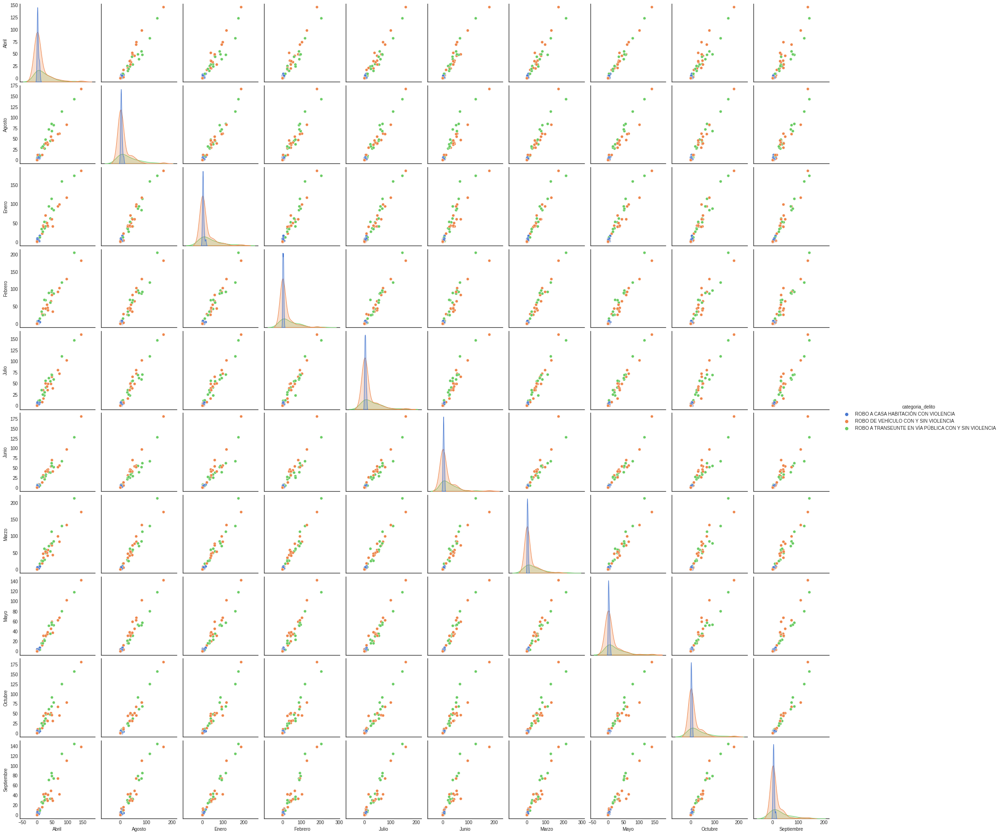

In [ ]:
plt.figure(figsize=(25,8))
sns.pairplot(delit_class, hue='categoria_delito', diag_kind='kde')

Ahora lo que intentaremos es implementar un modelo de regresión logística para realizar la clasificación por mes con respecto al número de robos para ver si es que tener vehiculo en la CDMX es más seguro que andar a pie.

para esto recordemos que el modelo de regresión logistica tiene la forma 
$$ \theta = logistic(\alpha+\beta X) $$ 
$$ y \sim Bernoulli(\theta)$$

A pesar del nombre la regresión logística no es un modelo de regresión sino de clasificación. 

(Insertar imagen pp152)

In [ ]:
# Obtenemos los valores para nuestra regresion
df_delit = delit_class.query("categoria_delito == ('ROBO DE VEHÍCULO CON Y SIN VIOLENCIA', 'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA')")
# Obtenemos las categorías de los delitos
y_0 = pd.Categorical(df_delit['categoria_delito']).codes
# Para el mes de la muestra tomamos los valores de marzo
x_n = ['Marzo']
x_0 = df_delit[x_n].values

mu_0 = np.mean(df_delit['Marzo'])
sd_0 = np.std(df_delit['Marzo'])

print(mu_0, sd_0)

21.93548387096774 40.78155983548606


In [ ]:
with pm.Model() as model_0:
    alpha = pm.Normal('alpha', mu=0, sd=10)
    beta = pm.Normal('beta', mu=0, sd=10)
    
    mu = alpha + pm.math.dot(x_0, beta)
    #theta = pm.Deterministic('theta', tt.nnet.sigmoid(mu))
    theta = pm.Deterministic('theta', 1 / (1 + pm.math.exp(-mu))) # Modelos sigmoide de la regresion logistica
    
    bd = pm.Deterministic('bd', -alpha/beta)
    
    yl = pm.Bernoulli('yl', p=theta, observed=y_0)

    start = pm.find_MAP()
    step = pm.NUTS()
    trace_0 = pm.sample(5000, step, start)

/usr/local/lib/python3.6/dist-packages/pymc3/tuning/starting.py:61: UserWarning: find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.
  warnings.warn('find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.')
logp = -6,001.5, ||grad|| = 39,821: 100%|██████████| 9/9 [00:00<00:00, 964.18it/s]
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]
100%|██████████| 5500/5500 [00:07<00:00, 774.32it/s]
The acceptance probability does not match the target. It is 0.8802952678457524, but should be close to 0.8. Try to increase the number of tuning steps.


In [ ]:
varnames = ['alpha', 'beta', 'bd']
pm.trace_to_dataframe(trace_0)

,alpha,beta,theta__0_0,theta__1_0,theta__2_0,theta__3_0,theta__4_0,theta__5_0,theta__6_0,theta__7_0,theta__8_0,theta__9_0,theta__10_0,theta__11_0,theta__12_0,theta__13_0,theta__14_0,theta__15_0,theta__16_0,theta__17_0,theta__18_0,theta__19_0,theta__20_0,theta__21_0,theta__22_0,theta__23_0,theta__24_0,theta__25_0,theta__26_0,theta__27_0,theta__28_0,theta__29_0,theta__30_0,theta__31_0,theta__32_0,theta__33_0,theta__34_0,theta__35_0,theta__36_0,theta__37_0,...,theta__54_0,theta__55_0,theta__56_0,theta__57_0,theta__58_0,theta__59_0,theta__60_0,theta__61_0,theta__62_0,theta__63_0,theta__64_0,theta__65_0,theta__66_0,theta__67_0,theta__68_0,theta__69_0,theta__70_0,theta__71_0,theta__72_0,theta__73_0,theta__74_0,theta__75_0,theta__76_0,theta__77_0,theta__78_0,theta__79_0,theta__80_0,theta__81_0,theta__82_0,theta__83_0,theta__84_0,theta__85_0,theta__86_0,theta__87_0,theta__88_0,theta__89_0,theta__90_0,theta__91_0,theta__92_0,bd
0,0.93,-6.50e-04,0.72,0.72,0.71,0.71,0.72,0.72,0.72,0.71,0.71,0.71,0.71,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.72,0.70,0.71,0.72,0.72,0.72,0.72,0.72,0.70,0.70,0.72,0.72,0.72,0.72,0.72,...,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.72,0.71,0.70,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.71,0.71,0.72,0.72,1425.16
1,0.92,-4.93e-04,0.72,0.72,0.71,0.71,0.72,0.72,0.72,0.71,0.71,0.71,0.71,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.71,0.71,0.71,0.70,0.71,0.72,0.72,0.72,0.72,0.72,0.70,0.70,0.72,0.72,0.72,0.72,0.72,...,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.72,0.71,0.71,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.71,0.71,0.72,0.72,1873.97
2,0.90,1.30e-04,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,...,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,-6870.11
3,0.86,3.37e-04,0.70,0.70,0.71,0.71,0.70,0.70,0.70,0.71,0.71,0.71,0.71,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.71,0.71,0.70,0.70,0.71,0.71,0.70,0.70,0.70,0.70,0.70,0.71,0.71,0.70,0.70,0.70,0.70,0.70,...,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.70,0.71,0.70,0.70,0.70,0.71,0.70,0.70,0.70,0.70,0.71,0.71,0.70,0.70,0.71,0.70,0.70,-2551.72
4,0.96,-1.39e-03,0.72,0.72,0.70,0.70,0.72,0.72,0.72,0.71,0.71,0.71,0.70,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.70,0.72,0.72,0.69,0.71,0.72,0.72,0.72,0.72,0.72,0.69,0.68,0.72,0.72,0.72,0.72,0.72,...,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.72,0.71,0.71,0.72,0.72,0.72,0.69,0.72,0.72,0.72,0.72,0.70,0.71,0.72,0.72,0.71,0.72,0.72,688.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.92,-6.67e-04,0.71,0.71,0.70,0.70,0.71,0.71,0.71,0.71,0.71,0.71,0.70,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.70,0.71,0.71,0.70,0.71,0.71,0.71,0.71,0.71,0.71,0.70,0.70,0.71,0.71,0.71,0.71,0.71,...,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.70,0.71,0.71,0.71,0.71,0.70,0.71,0.71,0.71,0.71,0.71,0.71,1375.24
9996,0.88,5.40e-04,0.71,0.71,0.72,0.72,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.72,0.71,0.71,0.72,0.71,0.71,0.71,0.71,0.71,0.71,0.72,0.72,0.71,0.71,0.71,0.71,0.71,...,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.71,

Optimización de las trazas obtenidas para los valores $\alpha$ y $\beta$ de la regresión logística.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff1258abdd8>,
      dtype=object)

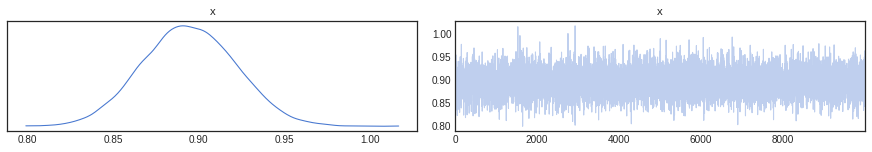

In [ ]:
pm.traceplot(trace_0['alpha'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff11cb5b7b8>,
      dtype=object)

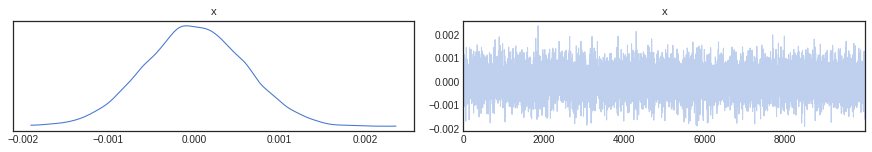

In [ ]:
pm.traceplot(trace_0['beta'])

Conclusión del modelo:
El modelo de regresión lineal simple no es bueno, pues con un solo 1 mes de información y 2 categorías no se puede hacer una buena clasificación sigmoide de los datos, lo que se necesitara hacer es aplicar un  modelo más general i.e una reresión logistica multiple.

Text(0, 0.5, '$\\theta$')

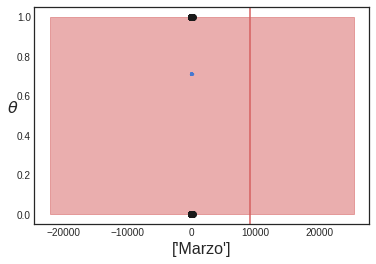

In [ ]:
theta = trace_0['theta'].mean(axis=0)
idx_1 = np.argsort(x_0)
plt.plot(x_0[idx_1].reshape(1,93), theta[idx_1].reshape(1,93), color='b', lw=3);
plt.plot(x_0, theta, color='b', lw=3);

plt.axvline(trace_0['bd'].mean(), ymax=1, color='r')
bd_hpd = pm.hpd(trace_0['bd'])
plt.fill_betweenx([0, 1], bd_hpd[0], bd_hpd[1], color='r', alpha=0.5)

plt.plot(x_0, y_0, 'o', color='k')
theta_hpd = pm.hpd(trace_0['theta'])[idx_1]
#plt.fill_between(x_0[idx_1].reshape(1,93), theta_hpd[:,0], theta_hpd[:,1], color='b', alpha=0.5)
#plt.fill_between(x_0, theta_hpd[:,0], theta_hpd[:,1], color='b', alpha=0.5)


plt.xlabel(x_n, fontsize=16)
plt.ylabel(r'$\theta$', rotation=0, fontsize=16)

## Modelo de regresion logística múltiple.

In [ ]:
# Tomamos los valores para 3 diferentes meses para ver los delitos.
x_n = ['Enero','Febrero', 'Marzo']
x_1 = df_delit[x_n].values

with pm.Model() as model_1:
    # Derinimos aprioris no deterministas
    alpha = pm.Normal('alpha', mu=0, sd=10)
    beta = pm.Normal('beta', mu=0, sd=2, shape=len(x_n))
    
    mu = alpha + pm.math.dot(x_1, beta)
    # Definimos la función logistica
    theta = 1 / (1 + pm.math.exp(-mu))
    # Calculamos el ajuste de comparación
    bd = pm.Deterministic('bd', -alpha/beta[1] - beta[0]/beta[1] * x_1[:,0])
    
    # Se define la función de maxima verosimiliutd con respecto a los valores ya observados
    yl = pm.Bernoulli('yl', p=theta, observed=y_0)
    # Implementación del modelo
    start = pm.find_MAP()
    step = pm.NUTS()
    trace_1 = pm.sample(1000, step, start)
    #trace_1 = pm.sample(1000)

/usr/local/lib/python3.6/dist-packages/pymc3/tuning/starting.py:61: UserWarning: find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.
  warnings.warn('find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.')
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
logp = -62.103, ||grad|| = 347.7: 100%|██████████| 30/30 [00:00<00:00, 1340.52it/s]  
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]
100%|██████████| 1500/1500 [00:07<00:00, 207.02it/s]
The acceptance probability does not match the tar

In [ ]:
chain_1 = trace_1[100:]
pm.trace_to_dataframe(chain_1)

,alpha,beta__0,beta__1,beta__2,bd__0,bd__1,bd__2,bd__3,bd__4,bd__5,bd__6,bd__7,bd__8,bd__9,bd__10,bd__11,bd__12,bd__13,bd__14,bd__15,bd__16,bd__17,bd__18,bd__19,bd__20,bd__21,bd__22,bd__23,bd__24,bd__25,bd__26,bd__27,bd__28,bd__29,bd__30,bd__31,bd__32,bd__33,bd__34,bd__35,...,bd__53,bd__54,bd__55,bd__56,bd__57,bd__58,bd__59,bd__60,bd__61,bd__62,bd__63,bd__64,bd__65,bd__66,bd__67,bd__68,bd__69,bd__70,bd__71,bd__72,bd__73,bd__74,bd__75,bd__76,bd__77,bd__78,bd__79,bd__80,bd__81,bd__82,bd__83,bd__84,bd__85,bd__86,bd__87,bd__88,bd__89,bd__90,bd__91,bd__92
0,1.27,0.03,-6.49e-02,1.68e-02,19.51,19.51,58.53,47.38,19.51,19.98,19.51,43.66,38.55,48.31,47.38,19.51,19.51,19.51,19.51,19.51,19.98,19.51,19.98,19.51,38.55,65.49,22.30,20.90,93.82,42.73,19.51,19.51,21.83,19.51,19.51,72.46,73.85,20.44,19.98,19.51,...,21.37,19.51,19.98,20.44,20.44,19.98,20.90,19.51,19.98,19.98,19.51,19.51,19.51,19.51,19.51,19.51,19.51,19.98,19.51,19.51,19.51,19.51,19.98,36.23,38.09,20.44,21.37,35.30,63.17,19.51,19.51,19.98,19.51,63.17,39.48,19.51,32.05,52.02,19.51,19.98
1,1.68,-0.09,-2.52e-03,7.75e-02,665.15,665.15,-2439.40,-1552.39,665.15,628.19,665.15,-1256.72,-850.17,-1626.30,-1552.39,665.15,665.15,665.15,665.15,665.15,628.19,665.15,628.19,665.15,-850.17,-2993.78,443.39,554.27,-5248.27,-1182.80,665.15,665.15,480.35,665.15,665.15,-3548.17,-3659.04,591.23,628.19,665.15,...,517.31,665.15,628.19,591.23,591.23,628.19,554.27,665.15,628.19,628.19,665.15,665.15,665.15,665.15,665.15,665.15,665.15,628.19,665.15,665.15,665.15,665.15,628.19,-665.37,-813.21,591.23,517.31,-591.46,-2808.99,665.15,665.15,628.19,665.15,-2808.99,-924.09,665.15,-332.74,-1921.98,665.15,628.19
2,1.29,-0.02,-2.95e-02,3.01e-02,43.63,43.63,-0.87,11.85,43.63,43.10,43.63,16.08,21.91,10.79,11.85,43.63,43.63,43.63,43.63,43.63,43.10,43.63,43.10,43.63,21.91,-8.82,40.45,42.04,-41.13,17.14,43.63,43.63,40.98,43.63,43.63,-16.76,-18.35,42.57,43.10,43.63,...,41.51,43.63,43.10,42.57,42.57,43.10,42.04,43.63,43.10,43.10,43.63,43.63,43.63,43.63,43.63,43.63,43.63,43.10,43.63,43.63,43.63,43.63,43.10,24.56,22.44,42.57,41.51,25.62,-6.17,43.63,43.63,43.10,43.63,-6.17,20.85,43.63,29.33,6.55,43.63,43.10
3,1.32,-0.02,-3.15e-02,2.83e-02,41.75,41.75,-4.64,8.61,41.75,41.20,41.75,13.03,19.11,7.51,8.61,41.75,41.75,41.75,41.75,41.75,41.20,41.75,41.20,41.75,19.11,-12.93,38.44,40.10,-46.62,14.14,41.75,41.75,38.99,41.75,41.75,-21.21,-22.87,40.65,41.20,41.75,...,39.54,41.75,41.20,40.65,40.65,41.20,40.10,41.75,41.20,41.20,41.75,41.75,41.75,41.75,41.75,41.75,41.75,41.20,41.75,41.75,41.75,41.75,41.20,21.87,19.66,40.65,39.54,22.97,-10.17,41.75,41.75,41.20,41.75,-10.17,18.00,41.75,26.84,3.09,41.75,41.20
4,1.45,-0.03,-4.37e-03,1.50e-02,330.88,330.88,-162.56,-21.58,330.88,325.01,330.88,25.42,90.03,-33.33,-21.58,330.88,330.88,330.88,330.88,330.88,325.01,330.88,325.01,330.88,90.03,-250.68,295.64,313.26,-609.01,37.16,330.88,330.88,301.51,330.88,330.88,-338.79,-356.42,319.13,325.01,330.88,...,307.38,330.88,325.01,319.13,319.13,325.01,313.26,330.88,325.01,325.01,330.88,330.88,330.88,330.88,330.88,330.88,330.88,325.01,330.88,330.88,330.88,330.88,325.01,119.41,95.91,319.13,307.38,131.15,-221.31,330.88,330.88,325.01,330.88,-221.31,78.28,330.88,172.27,-80.32,330.88,325.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,1.25,-0.04,-5.25e-02,7.24e-02,23.86,23.86,-41.89,-23.10,23.86,23.08,23.86,-16.84,-8.23,-24.67,-23.10,23.86,23.86,23.86,23.86,23.86,23.08,23.86,23.08,23.86,-8.23,-53.63,19.17,21.52,-101.38,-15.28,23.86,23.86,19.95,23.86,23.86,-65.37,-67.72,22.30,23.08,23.86,...,20.73,23.86,23.08,22.30,22.30,23.08,21.52,23.86,23.08,23.08,23.86,23.86,23.86,23.86,23.86,23.86,23.86,23.08,23.86,23.86,23.86,23.86,23.08,-4.32,-7.45,22.30,20.73,-2.75,-49.72,23.86,23.86,23.08,23.86,-

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60eb9cdc18>,
      dtype=object)

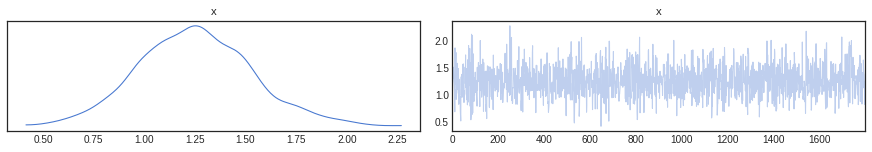

In [ ]:
pm.traceplot(chain_1['alpha'])

/usr/local/lib/python3.6/dist-packages/arviz/data/base.py:174: UserWarning: More chains (1800) than draws (3). Passed array should have shape (chains, draws, *shape)
  UserWarning,


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60fcaa60f0>,
      dtype=object)

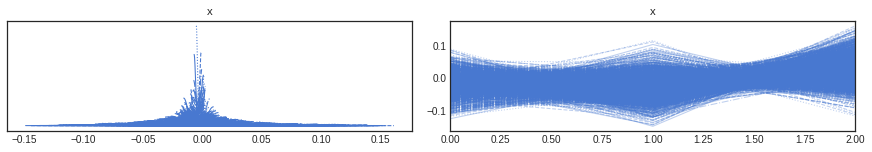

In [ ]:
pm.traceplot(chain_1['beta']) # Se tarda un chingo aguantar mejor

Text(0, 0.5, 'Enero')

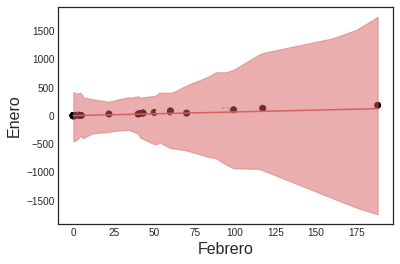

In [ ]:
idx = np.argsort(x_1[:,0])
ld = chain_1['bd'].mean(0)[idx]
plt.scatter(x_1[:,0], x_1[:,1], c=y_0)
plt.plot(x_1[:,0][idx], ld, color='r');

ld_hpd = pm.hpd(chain_1['bd'])[idx]
plt.fill_between(x_1[:,0][idx], ld_hpd[:,0], ld_hpd[:,1], color='r', alpha=0.5);

# Los crimenes aumentaron de un mes a otro y lo continuarán haciendo
plt.xlabel(x_n[1], fontsize=16)
plt.ylabel(x_n[0], fontsize=16)

Analisis para los meses del inicio de la pandemía

In [ ]:
# Tomamos los valores para 3 diferentes meses para ver los delitos.
x_n = ['Marzo','Abril', 'Mayo']
x_1 = df_delit[x_n].values

with pm.Model() as model_1:
    # Derinimos aprioris no deterministas
    alpha = pm.Normal('alpha', mu=0, sd=10)
    beta = pm.Normal('beta', mu=0, sd=2, shape=len(x_n))
    
    mu = alpha + pm.math.dot(x_1, beta)
    # Definimos la función logistica
    theta = 1 / (1 + pm.math.exp(-mu))
    # Calculamos el ajuste de comparación
    bd = pm.Deterministic('bd', -alpha/beta[1] - beta[0]/beta[1] * x_1[:,0])
    
    # Se define la función de maxima verosimiliutd con respecto a los valores ya observados
    yl = pm.Bernoulli('yl', p=theta, observed=y_0)
    # Implementación del modelo
    start = pm.find_MAP()
    step = pm.NUTS()
    trace_1 = pm.sample(1000, step, start)
    #trace_1 = pm.sample(1000)

/usr/local/lib/python3.6/dist-packages/pymc3/tuning/starting.py:61: UserWarning: find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.
  warnings.warn('find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.')
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
logp = -75.745, ||grad|| = 143.06: 100%|██████████| 4/4 [00:00<00:00, 425.79it/s]
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]
100%|██████████| 1500/1500 [00:11<00:00, 128.87it/s]


Devolvemos la matriz con sus valores dispersos de la regresión multiple con la cual calcularemos el resto.

In [ ]:
chain_1 = trace_1[100:]
pm.trace_to_dataframe(chain_1)

,alpha,beta__0,beta__1,beta__2,beta__3,beta__4,bd__0,bd__1,bd__2,bd__3,bd__4,bd__5,bd__6,bd__7,bd__8,bd__9,bd__10,bd__11,bd__12,bd__13,bd__14,bd__15,bd__16,bd__17,bd__18,bd__19,bd__20,bd__21,bd__22,bd__23,bd__24,bd__25,bd__26,bd__27,bd__28,bd__29,bd__30,bd__31,bd__32,bd__33,...,bd__53,bd__54,bd__55,bd__56,bd__57,bd__58,bd__59,bd__60,bd__61,bd__62,bd__63,bd__64,bd__65,bd__66,bd__67,bd__68,bd__69,bd__70,bd__71,bd__72,bd__73,bd__74,bd__75,bd__76,bd__77,bd__78,bd__79,bd__80,bd__81,bd__82,bd__83,bd__84,bd__85,bd__86,bd__87,bd__88,bd__89,bd__90,bd__91,bd__92
0,1.16,-0.14,2.36e-02,2.69e-01,0.24,-0.29,-49.28,-43.54,432.72,392.55,-49.28,-49.28,-49.28,231.89,283.53,260.58,363.86,-49.28,-49.28,-43.54,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,289.27,426.98,-9.11,-3.37,696.67,237.63,-49.28,-49.28,-26.32,-49.28,-43.54,599.12,713.88,-26.32,...,-20.59,-49.28,-49.28,-37.80,-49.28,-32.06,-26.32,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,-49.28,117.13,151.55,-49.28,-43.54,99.91,518.79,-49.28,-49.28,-43.54,-49.28,352.39,185.98,-49.28,94.17,254.84,-49.28,-49.28
1,1.37,-0.14,9.32e-02,1.76e-01,0.20,-0.22,-14.69,-13.19,111.81,101.27,-14.69,-14.69,-14.69,59.10,72.65,66.63,93.74,-14.69,-14.69,-13.19,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,74.16,110.30,-4.15,-2.64,181.09,60.61,-14.69,-14.69,-8.67,-14.69,-13.19,155.48,185.60,-8.67,...,-7.16,-14.69,-14.69,-11.68,-14.69,-10.17,-8.67,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,-14.69,28.98,38.02,-14.69,-13.19,24.46,134.40,-14.69,-14.69,-13.19,-14.69,90.73,47.05,-14.69,22.96,65.12,-14.69,-14.69
2,1.15,-0.06,1.05e-01,6.67e-03,0.04,-0.05,-10.92,-10.31,40.58,36.29,-10.92,-10.92,-10.92,19.12,24.64,22.18,33.22,-10.92,-10.92,-10.31,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,25.25,39.96,-6.63,-6.02,68.78,19.73,-10.92,-10.92,-8.47,-10.92,-10.31,58.36,70.62,-8.47,...,-7.86,-10.92,-10.92,-9.70,-10.92,-9.09,-8.47,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,-10.92,6.86,10.53,-10.92,-10.31,5.02,49.77,-10.92,-10.92,-10.31,-10.92,31.99,14.21,-10.92,4.40,21.57,-10.92,-10.92
3,1.16,-0.06,1.07e-01,-1.57e-03,0.04,-0.05,-10.83,-10.25,37.92,33.86,-10.83,-10.83,-10.83,17.61,22.83,20.51,30.96,-10.83,-10.83,-10.25,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,23.41,37.34,-6.77,-6.19,64.62,18.19,-10.83,-10.83,-8.51,-10.83,-10.25,54.75,66.36,-8.51,...,-7.93,-10.83,-10.83,-9.67,-10.83,-9.09,-8.51,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,-10.83,6.00,9.48,-10.83,-10.25,4.26,46.63,-10.83,-10.83,-10.25,-10.83,29.80,12.96,-10.83,3.68,19.93,-10.83,-10.83
4,1.30,-0.07,1.51e-01,-4.01e-02,0.08,-0.09,-8.62,-8.15,30.77,27.49,-8.62,-8.62,-8.62,14.36,18.58,16.70,25.14,-8.62,-8.62,-8.15,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,19.05,30.30,-5.34,-4.87,52.34,14.83,-8.62,-8.62,-6.74,-8.62,-8.15,44.36,53.74,-6.74,...,-6.27,-8.62,-8.62,-7.68,-8.62,-7.21,-6.74,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,-8.62,4.98,7.79,-8.62,-8.15,3.57,37.80,-8.62,-8.62,-8.15,-8.62,24.20,10.61,-8.62,3.10,16.23,-8.62,-8.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,1.58,-0.12,9.25e-02,1.81e-01,-0.02,-0.08,-17.11,-15.77,95.41,86.03,-17.11,-17.11,-17.11,48.53,60.58,55.22,79.33,-17.11,-17.11,-15.77,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,61.92,94.07,-7.73,-6.39,157.02,49.86,-17.11,-17.11,-11.75,-17.11,-15.77,134.25,161.04,-11.75,...,-10.41,-17.11,-17.11,-14.43,-17.11,-13.09,-11.75,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,-17.11,21.74,29.77,-17.1

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5bd4d0320>,
      dtype=object)

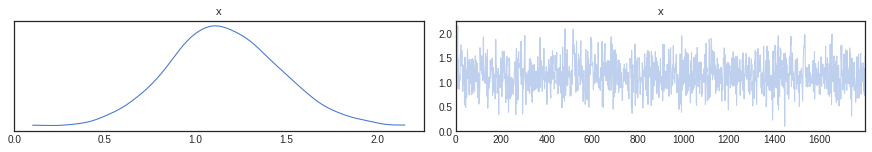

In [ ]:
pm.traceplot(chain_1['alpha'])

/usr/local/lib/python3.6/dist-packages/arviz/data/base.py:174: UserWarning: More chains (1800) than draws (3). Passed array should have shape (chains, draws, *shape)
  UserWarning,


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5d4dc0550>,
      dtype=object)

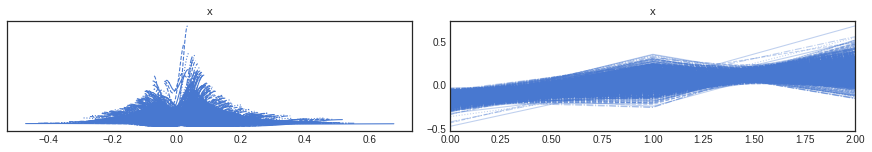

In [ ]:
pm.traceplot(chain_1['beta']) # Se tarda un chingo aguantar mejor

Una vez que ya hicimos correr la simulación, calculamos las regresiones logísticas para cada uno de los meses para poder observar como es que se cargaron los delitos .

Comparación de la regresión lógistica multiple para 2 diferentes meses (En ese caso Marzo y Abril).
Podemos observar que los crímenes no variaron mucho y se mantuvieron de igual forma en estos periodos.

Text(0, 0.5, 'Marzo')

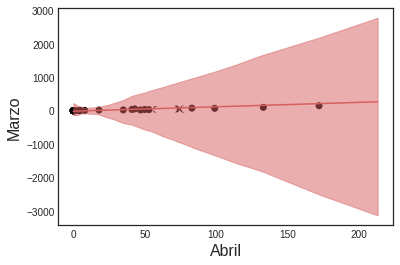

In [ ]:
idx = np.argsort(x_1[:,0])
ld = chain_1['bd'].mean(0)[idx]
plt.scatter(x_1[:,0], x_1[:,1], c=y_0)
plt.plot(x_1[:,0][idx], ld, color='r');

ld_hpd = pm.hpd(chain_1['bd'])[idx]
plt.fill_between(x_1[:,0][idx], ld_hpd[:,0], ld_hpd[:,1], color='r', alpha=0.5);

# Los crimenes aumentaron de un mes a otro y lo continuarán haciendo
plt.xlabel(x_n[1], fontsize=16)
plt.ylabel(x_n[0], fontsize=16)

Regresión logística para los meses de Marzo Y Mayo, se puede observar que los crímenes se agudizaron más en Mayo (recordar que en marzo inicio el confinamiento y en principio se respetaban las regulaciones para reducir la movilidad) por la relajación de medidas del confinamiento.

Text(0, 0.5, 'Marzo')

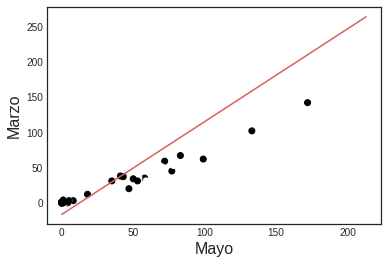

In [ ]:
idx = np.argsort(x_1[:,0])
ld = chain_1['bd'].mean(0)[idx]
plt.scatter(x_1[:,0], x_1[:,2], c=y_0)
plt.plot(x_1[:,0][idx], ld, color='r');

ld_hpd = pm.hpd(chain_1['bd'])[idx]
#plt.fill_between(x_1[:,1][idx], ld_hpd[:,1], ld_hpd[:,2], color='r', alpha=0.5);

# Los crímenes aumentaron de un mes a otro y lo continuaran haciendo
plt.xlabel(x_n[2], fontsize=16)
plt.ylabel(x_n[0], fontsize=16)

Comparación de la regresion logistica para Abril y Mayo, a diferencia de lo que pasa con marzo y abril, aquí la tendencia ya no es tan lineal y se empieza a ver en algunos puntos la tendencia que es observable en las bandas.

Text(0, 0.5, 'Abril')

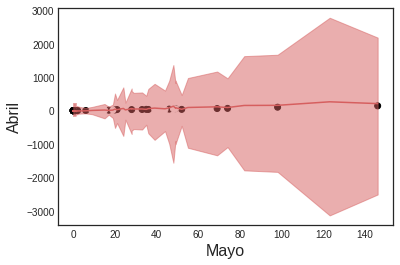

In [ ]:
idx = np.argsort(x_1[:,1])
ld = chain_1['bd'].mean(0)[idx]
plt.scatter(x_1[:,1], x_1[:,2], c=y_0)
plt.plot(x_1[:,1][idx], ld, color='r');

ld_hpd = pm.hpd(chain_1['bd'])[idx]
plt.fill_between(x_1[:,1][idx], ld_hpd[:,1], ld_hpd[:,0], color='r', alpha=0.5);

# Los creimesnes aumentaron de un mes a otro y lo continuaran haciendo
plt.xlabel(x_n[2], fontsize=16)
plt.ylabel(x_n[1], fontsize=16)

# Correlación de las categorías de delitos.

Realizamos un mapa de calor para poder determinar la correlación que existe entre diferentes tipos de delitos en la Ciudad de México, observemos que hay algunos tipos de delitos que están altamente correlacionados y otros que no lo están.

En general los delitos de robo tienen una correlación similar, no todos los tipos de delitos tienen la misma correlación por lo que no podemos trabajarlos como eventos independientes unos de otros.

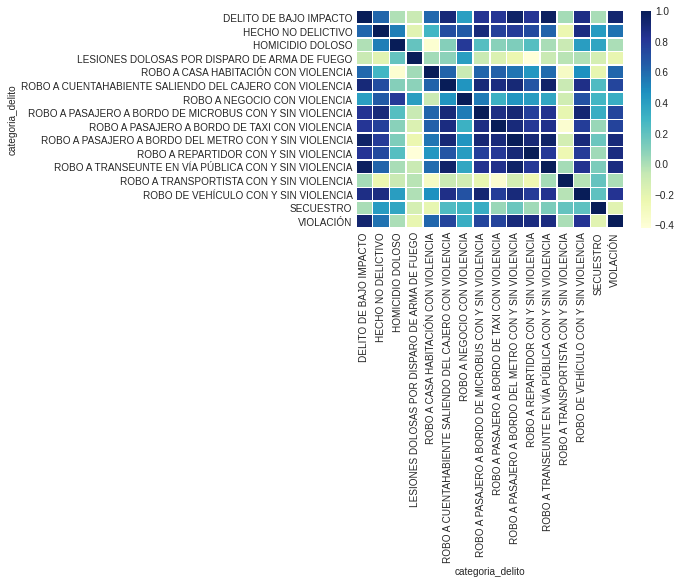

In [ ]:
delitos_categoria = pd.pivot_table(data=data_pgj, index='mes_hechos',columns='categoria_delito', values='ao_hechos', aggfunc='count')
delitos_categoria = delitos_categoria.replace(np.nan, 0)
delitos_categoria

corr_del = delitos_categoria.corr()
corr_del

# Veamos como es la correlacióón entre las categorias de delitos en la CDMX
sns.heatmap(corr_del, linewidths=0.5, cmap="YlGnBu")

De lo anterior, viene algo que ya nos esperabamos, algunos delitos estan correlacionados y muy parecidos, como los robos que estan muy correlacionados entre sí.

¿Podremos decir algo acerca de como es que evolucionaran estos delitos en el futuro o intentar describir como es que se relacionan?

# Predicción nominal de valores para multiples grupos

### ANOVA Logistica

![picture](https://raw.githubusercontent.com/misaelLS21/Bayesian_proyect/main/anova_logistic.png)

En algunas situaciones es necesario realizar análisis con variables dicotómicas, pero las predicciones son de tipo nominal, para poder realizar esto lo que podemos hacer es usar una adaptación de la regresion logistica  adaptado a un modelo ANOVA para variables dicotómicas.

Iniciamos con un modelo ANOVA que genera una predicción para una tendencia pa cada una de las condiciones, entonces después ese modelo es pasado por una función sigmoide lo cual lo convierte la predicción nominal a uno de tipo $y=1$ para k valores de diferentes grupos de manera simultanea como lo muestra el diagrama del modelo.

Desarrollando la idea a más detalle, para los valores nominales $M_0$ se pueden crear comparaciones para diferentes parámetros $\beta$ en un modelo ANOVA. Estos $\beta$ parámetros no son probabilidades, sin embargo pueden ser mapeados en una medida de probabilidad suando la regresión logística del estilo: 

$$ Logistic(\beta_0 + \sigma_j \beta_{[j]}x_{[j]}(i)$$

Que después, por medio de otra aplicación con una distribución gamma, podemos agrupar la información en $K$ grupos:

- $w_j(k-2)+1$ 
- $(1-w_j)(k-2)+1$

y con esto trabajar con la distribución binomial para aproximar los valores $y_{i|j}$ de una predicción nominal para variables dicotomicas conocida como un modelo `ANOVA Logistico`

En pocas palabras este es un modelo de clasificación predictivo.

Cosa que de manera independiente no podriamos hacer al trabajar con variables dicotómicas por separado.

En nuestro caso partícular nos gustaría clasificar y ver la distribución de los delitos que ha habido por cada categoría en la Ciudad de México en el 2020 y con base en esto ir comparando la proporción de tipos de delitos.



In [ ]:
pt_delitos = pd.pivot_table(data=data_pgj, index=['delito','categoria_delito'], columns='alcaldia_hechos',values='ao_hechos', aggfunc='count')
pt_delitos = pt_delitos.replace(np.nan,0)
pt_delitos = pt_delitos.reset_index()
pt_delitos['TOTALES'] = pt_delitos.iloc[:,2:].sum(1)
pt_delitos 


# Podemos calcular tabulados donde  por delito queremos calcular el % de delitos
# tRANSFORMAMOS LA COLUMNA DQUE NOS PIDEN A CATEGORICO
pt_delitos['categoria_delito'] = pt_delitos.categoria_delito.astype('category')

In [ ]:
# Calculemos el promedio de de tipos de delitos por alcaldía (o lugar :v)
pt_delitos.groupby('categoria_delito')['AZCAPOTZALCO','TOTALES'].sum().pipe(lambda x:x.AZCAPOTZALCO/x.TOTALES)
# Lo anterior nos indica la proporcion de delitos en comparación con el resto de la CDMX, esto es un estimado, ¿simulando como cambiará?

categoria_delito
DELITO DE BAJO IMPACTO                                     5.08e-02
HECHO NO DELICTIVO                                         3.59e-02
HOMICIDIO DOLOSO                                           4.13e-02
LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO              4.03e-02
ROBO A CASA HABITACIÓN CON VIOLENCIA                       5.74e-02
ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA    5.28e-02
ROBO A NEGOCIO CON VIOLENCIA                               5.47e-02
ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA    3.55e-02
ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA              8.77e-03
ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA      3.04e-02
ROBO A REPARTIDOR CON Y SIN VIOLENCIA                      6.96e-02
ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA       4.94e-02
ROBO A TRANSPORTISTA CON Y SIN VIOLENCIA                   2.03e-01
ROBO DE VEHÍCULO CON Y SIN VIOLENCIA                       5.12e-02
SECUESTRO                      

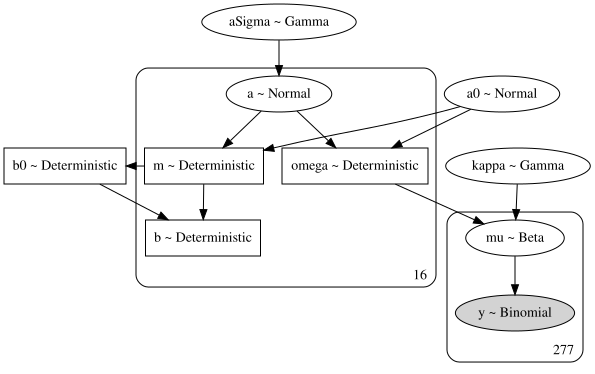

In [ ]:
# Mismos datos pero ahora un modelo un poco diferente.

pripos_idx = pt_delitos.categoria_delito.cat.codes.values
pripos_codes = pt_delitos.categoria_delito.cat.categories
n_pripos = pripos_codes.size

# Leemos la cantidad de delitos que tenemos almacenados
n_delitos = pt_delitos.index.size


with pm.Model() as hierarchical_model:
    # A diferencia del modelo anterior, ahora aproximamos desde el enfoque de la normal
    # Estos vuelven a ser nuestros hiperparametros y queremos ajustar de nuevo una binomial.
    aSigma = pm.Gamma('aSigma', 1.64, 0.32)
    a0 = pm.Normal('a0', 0.0, tau=1/2**2)
    a = pm.Normal('a', 0.0, tau=1/aSigma**2, shape=n_pripos) 
    
    # Como tenemos que tener variales dicotomicas entonces preparamos distribuaciones a-priori 
    # poco informativas para cada uno de los parametros que ajustaremos
    omega = pm.Deterministic('omega', pm.invlogit(a0 + a))
    kappa = pm.Gamma('kappa', 0.01, 0.01)
    
    # Ajustamos por medio de la conjugada Beta los parametros para cada uno de las categorias a ajustar
    mu = pm.Beta('mu',
                  omega[pripos_idx]*kappa+1, (1-omega[pripos_idx])*kappa+1,
                  shape = n_delitos)
    
    #y = pm.Binomial('y', n=df2.AtBats.values, p=mu, observed=df2.Hits.values)
    y = pm.Binomial('y', n=pt_delitos.TOTALES.values, p=mu, observed=pt_delitos.AZCAPOTZALCO.values)
    
    # Convert a0,a to sum-to-zero b0,b 
    m = pm.Deterministic('m', a0 + a)
    b0 = pm.Deterministic('b0', tt.mean(m))
    b = pm.Deterministic('b', m - b0) 

# Descripción gráfica del ajuste de los modelos que estamos realizando.
pm.model_to_graphviz(hierarchical_model)


In [ ]:
with hierarchical_model: # Para no matar a colab solo estamos haciendo una muestra pequeña de 1000 simulaciones
    trace4 = pm.sample(1000, cores=-1, nuts_kwargs={'target_accept':0.95})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu, kappa, a, a0, aSigma]
100%|██████████| 1500/1500 [00:21<00:00, 70.08it/s]
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.


Una vez implementado y ejecutado el modelo como podemos observar en las gráficas, no solamente pudimos clasificar cada uno de los diferentes tipos de delitos sino cuantificar intervalos para los delitos totales registrados en la Ciudad de México.

Como era esperado, los delitos de bajo impacto siguen siendo los predominantes con aumentos, pero también hay otros tipos de deltitos que parece que tenderán una alza, como los robos a transeuntes o los robos a vehiculos.



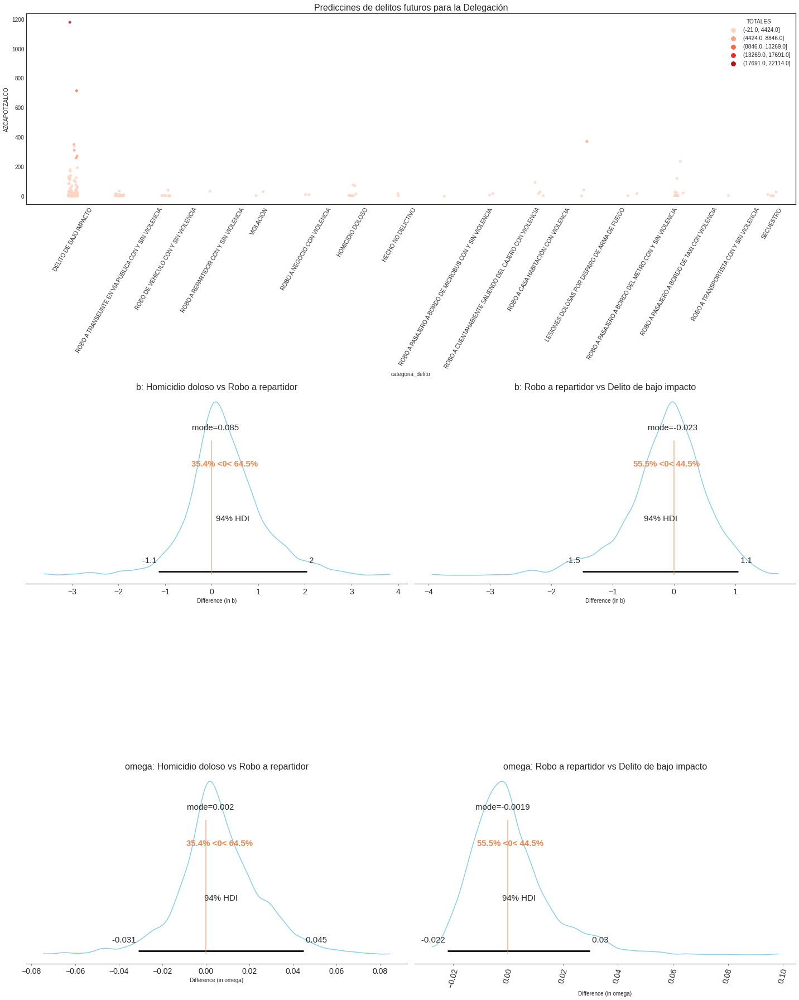

In [ ]:
f_dict = {'size':16}
plt.figure(figsize=(20,25))
# Define gridspec
gs = gridspec.GridSpec(3, 2)
ax1 = plt.subplot(gs[0,:])
ax2 = plt.subplot(gs[1,0])
ax3 = plt.subplot(gs[1,1])
ax4 = plt.subplot(gs[2,0])
ax5 = plt.subplot(gs[2,1])

sns.stripplot(x='categoria_delito', y='AZCAPOTZALCO', hue=pd.cut(pt_delitos.TOTALES, 5, precision=0),
              data=pt_delitos, jitter=True, palette='Reds', ax=ax1, alpha=.8);
plt.xticks(rotation=75)
#for pripos in np.arange(n_pripos):
#    plot_posterior(trace4['omega'][:,pripos], trace4['kappa'], pripos, ax=ax1)

ax1.set_xlim(xmin=-1)
ax1.set_title('Prediccines de delitos futuros para la Delegación', fontdict=f_dict)
ax1.set_xticklabels(['DELITO DE BAJO IMPACTO',
       'ROBO A TRANSEUNTE EN VÍA PÚBLICA CON Y SIN VIOLENCIA',
       'ROBO DE VEHÍCULO CON Y SIN VIOLENCIA',
       'ROBO A REPARTIDOR CON Y SIN VIOLENCIA', 'VIOLACIÓN',
       'ROBO A NEGOCIO CON VIOLENCIA', 'HOMICIDIO DOLOSO',
       'HECHO NO DELICTIVO',
       'ROBO A PASAJERO A BORDO DE MICROBUS CON Y SIN VIOLENCIA',
       'ROBO A CUENTAHABIENTE SALIENDO DEL CAJERO CON VIOLENCIA',
       'ROBO A CASA HABITACIÓN CON VIOLENCIA',
       'LESIONES DOLOSAS POR DISPARO DE ARMA DE FUEGO',
       'ROBO A PASAJERO A BORDO DEL METRO CON Y SIN VIOLENCIA',
       'ROBO A PASAJERO A BORDO DE TAXI CON VIOLENCIA',
       'ROBO A TRANSPORTISTA CON Y SIN VIOLENCIA', 'SECUESTRO'],rotation=60)

pm.plot_posterior(trace4['b'][:,6]-trace4['b'][:,3],
                   ref_val=0, ax=ax2, point_estimate='mode', color=color)
ax2.set_title('b: Homicidio doloso vs Robo a repartidor', fontdict=f_dict)
pm.plot_posterior(trace4['b'][:,3]-trace4['b'][:,0],
                   ref_val=0, ax=ax3, point_estimate='mode', color=color)
ax3.set_title('b: Robo a repartidor vs Delito de bajo impacto', fontdict=f_dict)
for ax in [ax2, ax3]:
    ax.set_xlabel('Difference (in b)')

pm.plot_posterior(trace4['omega'][:,6]-trace4['omega'][:,3],
                   ref_val=0, ax=ax4, point_estimate='mode', color=color)
ax4.set_title('omega: Homicidio doloso vs Robo a repartidor', fontdict=f_dict)
pm.plot_posterior(trace4['omega'][:,3]-trace4['omega'][:,0],
                   ref_val=0, ax=ax5, point_estimate='mode', color=color)
ax5.set_title('omega: Robo a repartidor vs Delito de bajo impacto', fontdict=f_dict)
for ax in [ax4, ax5]:
    ax.set_xlabel('Difference (in omega)')

plt.tight_layout();

Por último como se puede observar también hicimos una observación a como es que se estan desarrollando algunos cambios en contraste de las $b\sim Deterministic$ para diferentes tipos de categorías, donde recordemos que:

$$ b  = m - b_0$$
$$ b = (a_0+a) - b_0 $$

donde:
$$ a_0 \sim Normal$$
$$ a \sim Normal $$
$$ b_0 \sim \frac{1}{n}\Sigma m $$

En donde, entonces, de acuerdo al parámetro el contraste de tipos de categorías es muy similar.

El valor **mode** es el valor óptimo del rango de posibles valores para nuestra distribución $M_{i|j}$

Observemos por ejemplo que la relación de los delitos de bajo impacto con los robos a repartidor si es más alta.

# Mapa de crimenes en la Ciudad con Folium.

En esta última sección queremos mostrar geográficamente los delitos que han ocurrido en la ciudad aprovechando que tenemos la información de estos, utilizando geopandas para poder guardar los datos de los delitos cometidos en la Ciudad de México y así observar los delitos de forma física en un mapa.

El siguiente mapa presenta la siguiente información:
- Con puntos se gráfican de forma especifica cuando y donde suscedio un delito
- Se muestra la cuadricula de las zonas de patrullaje de la CDMX
- Se muestra la delimitación delegacional.

In [ ]:
list(data_pgj['delito'])

['DISCRIMINACION',
 'AMENAZAS',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'ENCUBRIMIENTO',
 'ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA',
 'NARCOMENUDEO POSESIÓN CON FINES DE VENTA, COMERCIO Y SUMINISTRO',
 'ROBO A NEGOCIO SIN VIOLENCIA POR FARDEROS (TIENDAS DE AUTOSERVICIO)',
 'ABUSO SEXUAL',
 'FRAUDE',
 'VIOLENCIA FAMILIAR',
 'FRAUDE',
 'AMENAZAS',
 'DESOBEDIENCIA Y RESISTENCIA DE PARTICULARES',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'ROBO DE MOTOCICLETA SIN VIOLENCIA',
 'CONTRA LA INTIMIDAD SEXUAL',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'ROBO DE VEHICULO DE SERVICIO PARTICULAR SIN VIOLENCIA',
 'ROBO DE VEHICULO DE SERVICIO PARTICULAR SIN VIOLENCIA',
 'ROBO A NEGOCIO SIN VIOLENCIA POR FARDEROS (TIENDAS DE AUTOSERVICIO)',
 'VIOLENCIA FAMILIAR',
 'TENTATIVA DE EXTORSION',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'VIOLENCIA FAMILIAR',
 'ABUSO SEXUAL',
 'ROBO A CASA HABITACION SIN VIOLENCIA',
 'VIOLENCIA FAMILIAR',
 'ABUSO DE AUTORIDAD Y USO ILEGAL DE LA FUERZA PUBLICA',
 'D

In [ ]:

delito = 'NARCOMENUDEO POSESI\xD3N CON FINES DE VENTA, COMERCIO Y SUMINISTRO' #@param ['HOMICIDIO POR ARMA DE FUEGO', 'HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (ATROPELLADO)', 'ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA', 'ROBO A NEGOCIO CON VIOLENCIA','NARCOMENUDEO POSESIÓN CON FINES DE VENTA, COMERCIO Y SUMINISTRO' ]



a = data_pgj[data_pgj['delito'] == delito] # Pudes escribir aquí el nombre del delito que quieres ver en el mapa.

geopoint_data = gpd.GeoDataFrame(a, geometry=gpd.points_from_xy(a.longitud, a.latitud))# geo dataframe

geopoint_data = geopoint_data.set_crs(epsg=4326, inplace=True)
geopoint_data = geopoint_data.dropna()
geopoint_data

alcaldias_geo = gpd.read_file('alcaldias/alcaldias.shp')
# transformamos los datos en formato necesitado
alcaldias_geo = alcaldias_geo.set_crs(epsg=4326, inplace=True)
alcaldias_geo

patrullage_geo = gpd.read_file('complements/zonas-de-patrullaje-2018.shp')
# Transformamos los datos
patrullage_geo = patrullage_geo.set_crs(epsg=4326, inplace=True)
patrullage_geo




m = folium.Map(location=[19.6260333, -95.5375005],tiles="cartodbpositron", zoom_start=7)
folium.GeoJson(data=alcaldias_geo["geometry"]).add_to(m) 
folium.GeoJson(data=patrullage_geo["geometry"]).add_to(m)
folium.GeoJson(data=geopoint_data, tooltip=folium.features.GeoJsonTooltip(fields=['delito','fecha_h','hora_h' ,'alcaldia_hechos','colonia_hechos', 'calle_hechos'])).add_to(m)
folium.LayerControl().add_to(m)
m

Ahora que sabemos que los crimenes se distribuyen muy aleatoriamente y hay zonas de la ciudad que no tiene zonas de patruyaje, observemos las medidas de seguridad que se han implementado por alcaldía en la CDMX.

In [ ]:
micalle_geo = gpd.read_file('complements/programa-mi-calle-shapes.shp')
# Transformamos los datos
micalle_geo = micalle_geo.set_crs(epsg=4326, inplace=True)
micalle_geo

m2 = folium.Map(location=[19.6260333, -95.5375005],tiles="cartodbpositron", zoom_start=7)
#folium.GeoJson(data=micalle_geo, tooltip=folium.features.GeoJsonTooltip(fields=['alcaldia','colonia', 'avance', 'prioritari'])).add_to(m2)
folium.GeoJson(data=micalle_geo["geometry"]).add_to(m2)

#folium.GeoJson(data=alcaldias_geo["geometry"]).add_to(m2) 
#folium.GeoJson(data=patrullage_geo["geometry"]).add_to(m2)

#folium.GeoJson(data=geopoint_data, tooltip=folium.features.GeoJsonTooltip(fields=['delito','fecha_h','hora_h' ,'alcaldia_hechos','colonia_hechos', 'calle_hechos'])).add_to(m)
folium.LayerControl().add_to(m2)
m2